CLEANING

In [ ]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
import string
from collections import Counter
from nltk.stem import PorterStemmer

# Load dataset into a DataFrame
df = pd.read_csv('/Users/natashasmith/Desktop/recipes_data.csv')

# Initialise NLTK resources
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialise lemmatiser and stopwords
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Additional cleaning functions
def remove_non_ascii(text):
    return re.sub(r'[^\x00-\x7F]', '', text)

def convert_to_lowercase(text):
    return text.lower()

def remove_noncontext_words(text):
    text = text.replace('\n', ' ')
    text = text.replace('&nbsp', ' ').replace('nbsp', ' ').replace('&lt', '').replace('&gt', '')
    text = text.replace("[", "").replace("]", "").replace("(", "").replace(")", "").replace("{", "").replace("}", "")
    text = text.replace(",", "").replace("...", "").replace(":", "").replace(";", "").replace("!", ".").replace("?", ".")
    text = re.sub(r"\[(.*?)\]", "", text)
    text = re.sub(r"\s+", " ", text)
    text = re.sub(r"\w+…|…", "", text)
    text = re.sub(r"(?<=\w)-(?=\w)", " ", text)
    text_without_urls = re.sub(r"http\S+|\bhttps\S+", "", text)
    words = text.split()
    noncontext_words = ['urllink', 'blog', 'date', 'maio', 'nbsp', 'azon', 'acjc', 'alsob']
    filtered_words = [word for word in words if word not in noncontext_words]
    return ' '.join(filtered_words)

def remove_short_words(text):
    words = text.split()
    filtered_words = [word for word in words if len(word) > 3]
    return ' '.join(filtered_words)

def remove_tags(text):
    text = re.sub(r'<.*?>', '', text)
    text = re.sub(r'<*?>', '', text)
    return text

def remove_numbers(text):
    pattern = r'\d+'
    result = re.sub(pattern, '', text)
    return result

def remove_punctuation_and_newlines(text):
    text = text.translate(str.maketrans('', '', string.punctuation))
    return text

def lemmatize_text(text):
    tokens = word_tokenize(text)
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return " ".join(lemmatized_tokens)

def stem_text(text):
    words = word_tokenize(text)
    stemmer = PorterStemmer()
    stemmed_words = [stemmer.stem(word) for word in words]
    return ' '.join(stemmed_words)

def replace_contractions(text):
    def replace(match):
        return contractions[match.group(0)]
    return contractions_re.sub(replace, text)

# Original content in lowercase
content_directions = [convert_to_lowercase(text) for text in df['directions']]
content_ingredients = [convert_to_lowercase(text) for text in df['ingredients']]

# Preprocess the 'directions' column
def preprocess_text(text):
    text = str(text)
    text = remove_non_ascii(text)
    text = convert_to_lowercase(text)
    text = remove_noncontext_words(text)
    text = remove_short_words(text)
    text = remove_tags(text)
    text = remove_numbers(text)
    text = remove_punctuation_and_newlines(text)
    text = lemmatize_text(text)
    text = stem_text(text)
    tokens = word_tokenize(text)
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token not in stop_words]
    unique_tokens = list(set(tokens))
    return ' '.join(unique_tokens)

# Apply preprocessing to the 'ingredients' and 'directions' columns
df['preprocessed_ingredients'] = df['ingredients'].apply(preprocess_text)
df['preprocessed_directions'] = df['directions'].apply(preprocess_text)

# Combine preprocessed 'ingredients' and 'directions' into 'preprocessed_full_recipe'
df['preprocessed_full_recipe'] = df['preprocessed_ingredients'] + ' ' + df['preprocessed_directions']

# Display the preprocessed DataFrame
print(df[['preprocessed_directions', 'preprocessed_ingredients', 'preprocessed_full_recipe']])


COMPUTE BERT SIMILARITY/EMBEDDINGS

In [ ]:
from transformers import BertTokenizer, BertModel
import torch
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
import time

# Initialise tokeniser and model
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Define function to get BERT embeddings for a batch of texts
def get_bert_embeddings_batch(texts, tokenizer, model, max_length=256):
    # Tokenise and encode the batch of texts with padding and truncation
    inputs = tokenizer(
        texts.tolist(),
        return_tensors='pt',
        padding=True,
        truncation=True,
        max_length=max_length
    )

    # Get BERT embeddings for the batch
    with torch.no_grad():
        outputs = model(**inputs)
        batch_embeddings = outputs.last_hidden_state.mean(dim=1).detach().numpy()

    return batch_embeddings

# Function to compute BERT similarity matrix for a batch
def compute_bert_similarity(batch):
    # Get BERT embeddings for the batch
    bert_embeddings = get_bert_embeddings_batch(batch, tokenizer, model)
    # Compute cosine similarity matrix from the embeddings
    return cosine_similarity(bert_embeddings)

# Define a batch size
batch_size = 100

# Load the dataset into a pandas dataframe
data = pd.read_csv('foodnetwork_recipes.csv')

# Drop rows with missing values and non-string inputs in the 'preprocessed_full_recipe' column
data = data.dropna(subset=['preprocessed_full_recipe'])
data = data[data['preprocessed_full_recipe'].apply(lambda x: isinstance(x, str))]

data_batches = np.array_split(data['preprocessed_full_recipe'], len(data) // batch_size + 1)

# Initialise a list to store the BERT similarity matrices of each batch
bert_matrices = []

start_batch = 495 # adjust this to start from where it got stuck

for i, batch in enumerate(data_batches[start_batch:]):
    try:
        # Print log message before processing each batch
        print(f"Processing batch {start_batch + i}...")

        start_time = time.time()

        # Check if the batch is empty (no rows)
        if len(batch) > 0:
            # Compute the BERT similarity matrix for the current batch
            bert_matrix = compute_bert_similarity(batch)
            # Store the BERT similarity matrix of the current batch
            bert_matrices.append(bert_matrix)

        # Save the BERT similarity matrix of the current batch to a file
        np.save(f'bert_similarity_batch_{start_batch + i}.npy', bert_matrix)

        # Print log message after processing each batch with the time taken
        print(f"Completed batch {start_batch + i} in {time.time() - start_time:.2f} seconds.")

    except Exception as e:
        # Log any exceptions that occur during the batch processing
        print(f"An error occurred while processing batch {start_batch + i}: {e}")

print("BERT similarity computation and saving completed")

VISUALISING BERT EMBEDINGS COMPUTED

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

import numpy as np

# Convert embeddings to a numpy array
embeddings_array = np.array(embeddings)

# Using t-SNE for 2D visualization
tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
tsne_result = tsne.fit_transform(embeddings_array)
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=data['cluster_label'], cmap='rainbow')
plt.colorbar()


# embeddings = data['averaged_embedding'].tolist()

# # Using PCA for 2D visualisation
# pca = PCA(n_components=2)
# pca_result = pca.fit_transform(embeddings)

# plt.scatter(pca_result[:, 0], pca_result[:, 1], c=data['cluster_label'], cmap='rainbow')
# plt.colorbar()
# plt.title('PCA Visualization of Embeddings')
# plt.show()

# # Using t-SNE for 2D visualisation
# tsne = TSNE(n_components=2, perplexity=30, n_iter=300)
# tsne_result = tsne.fit_transform(embeddings)

# plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=data['cluster_label'], cmap='rainbow')
# plt.colorbar()
# plt.title('t-SNE Visualization of Embeddings')
# plt.show()

In [ ]:
import pandas as pd

# Load dataset


data = pd.read_csv('/content/drive/My Drive/clustered_recipe.csv')

# Display the first few rows of the DataFrame
# data.head()

# Count the number of observations (rows)
num_observations = data.shape[0]
print(f"Number of observations: {num_observations}")

In [ ]:
# pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 44.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 28.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 84.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 70.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 25.6 MB/s eta 0:00:00


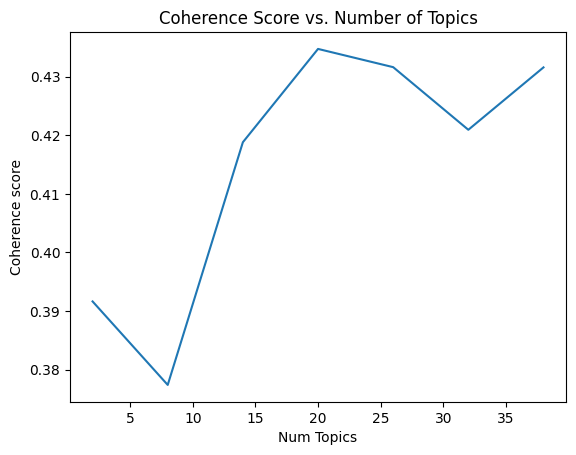

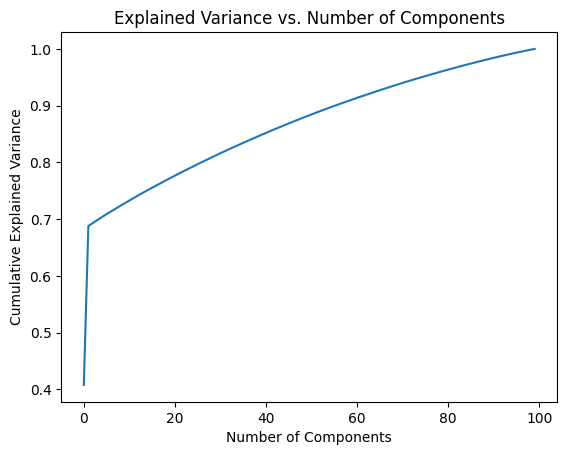

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 1:
- Lamb, Roasted Shallot and Chorizo Skewers with Rioja Vinaigrette
- Rum and Cola Cured Pork Tenderloin
- Meyer Lemon Curd Tart
- Matzo Brei
- Limoncello Spritzers


Cluster 2:
- Chicken Schnitzel with Mustard Sauce
- Chili Bowl Burger Sliders
- Plum Caprese Salad
- Big Island Tomato and Maui Onion Salad
- Winner: Double-Delight Peanut Butter Cookies


Cluster 3:
- Limoncello Macerated Strawberries with Mascarpone and Pistachios
- Onion Tart
- Brussels Sprout Slaw
- Beer Braised Chicken
- Pickled Cucumber and Red Cabbage


Cluster 4:
- Frozen Peach Bellini
- Neelys Sauteed Spinach
- Online Round 2 Recipe - Cajun Red Bean and Rice Soup
- Coconut Rice Pudding with Mango
- Orange Ricotta Pancakes with Caramelized Fig and Pistachio Compote


Cluster 5:
- Raspberry Lemonade
- Chocolate Caramel Toffee Cupcake
- Raw Fish: Poisson Cru
- Kale and Quinoa Salad
- Sweet Corn Blintzes with Cottage Cheese Filling


Cluster 6:
- Warm Mexican Crab Dip
- Pork and Noodle Stir-Fry
- Seared Mar

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from gensim.models import LdaModel, CoherenceModel
from gensim.corpora import Dictionary
import matplotlib.pyplot as plt
import numpy as np
import ast
from transformers import BertTokenizer


# Load the dataset
data = pd.read_csv('/content/drive/My Drive/clustered_recipe.csv')

def string_to_list(embedding_str):
    try:
        # Try converting using ast.literal_eval first
        return ast.literal_eval(embedding_str)
    except:
        # If that fails, manually process the string to extract numbers
        return [float(x) for x in embedding_str.strip('[]').split()]

# Convert the embeddings
embeddings = [string_to_list(embedding) if isinstance(embedding, str) else embedding for embedding in data['averaged_embedding']]


# Extract precomputed BERT embeddings
# embeddings = data['averaged_embedding'].tolist()
# embeddings = [ast.literal_eval(embedding) if isinstance(embedding, str) else embedding for embedding in embeddings]

# Ensure all entries are strings and filter out any NaN or non-string values
filtered_recipes = data['preprocessed_full_recipe'].dropna().astype(str).tolist()

# Tokenise recipes for LDA
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
texts = [tokenizer.tokenize(recipe) for recipe in filtered_recipes]
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Determine Optimal Number of Topics for LDA
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    coherence_values = []
    for num_topics in range(start, limit, step):
        model = LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return coherence_values

coherence_values = compute_coherence_values(dictionary=dictionary, corpus=corpus, texts=texts, start=2, limit=40, step=6)
x = range(2, 40, 6)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.title("Coherence Score vs. Number of Topics")
plt.show()

# Determine Optimal Number of PCA Components
pca = PCA()
pca.fit(embeddings)
explained_var = np.cumsum(pca.explained_variance_ratio_)
plt.plot(explained_var)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title("Explained Variance vs. Number of Components")
plt.show()

# Choose the number of components where explained variance is, for example, greater than 0.95
optimal_components = np.where(explained_var > 0.95)[0][0]

# Apply LDA with optimal number of topics and PCA with optimal components
optimal_topics = x[np.argmax(coherence_values)]
lda_model = LdaModel(corpus=corpus, num_topics=optimal_topics, id2word=dictionary, passes=15)
pca_optimal = PCA(n_components=optimal_components)
reduced_embeddings = pca_optimal.fit_transform(embeddings)

# Document Clustering
kmeans = KMeans(n_clusters=optimal_topics)
clusters = kmeans.fit_predict(reduced_embeddings)

# Print top recipes from each cluster
for i in range(optimal_topics):
    print(f"Cluster {i+1}:")
    sample_recipes = [data['title'].iloc[j] for j, cluster in enumerate(clusters) if cluster == i]
    for recipe in sample_recipes[:5]:
        print(f"- {recipe}")
    print("\n")


In [5]:
# pip install transformers
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [8]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from transformers import BertTokenizer
import ast

# Load the dataset
data = pd.read_csv('/content/drive/My Drive/clustered_recipe.csv')

def string_to_list(embedding_str):
    try:
        return ast.literal_eval(embedding_str)
    except:
        return [float(x) for x in embedding_str.strip('[]').split()]

# Convert the embeddings
embeddings = [string_to_list(embedding) if isinstance(embedding, str) else embedding for embedding in data['averaged_embedding']]

# Ensure all entries are strings and filter out any NaN or non-string values
filtered_recipes = data['preprocessed_full_recipe'].dropna().astype(str).tolist()

# Tokenise recipes for LDA
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
texts = [tokenizer.tokenize(recipe) for recipe in filtered_recipes]
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Apply PCA to reduce dimensions
pca = PCA(n_components=0.95)
reduced_embeddings = pca.fit_transform(embeddings)

# Apply KMeans clustering with 20 clusters
kmeans = KMeans(n_clusters=20)
clusters = kmeans.fit_predict(reduced_embeddings)

# Print top 5 recipes from each cluster
for i in range(20):
    print(f"Cluster {i+1}:")
    sample_recipes = [data['preprocessed_full_recipe'].iloc[j] for j, cluster in enumerate(clusters) if cluster == i]
    for recipe in sample_recipes[:5]:
        print(f"- {recipe}")
    print("\n")


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 1:
- pound larg pepper slice bourbon sirloin boneless tablespoon butter steak oliv oil onion stick salt cover pepper brown skillet turn add minut gener liquor heat cook cling inch platter gentli tast salt larg remain bit juic scrape melt medium golden stir bourbon thick occasion tablespoon butter side keep warm asid allow transfer slice serv pan simmer reduc bowl steak season oliv onion
- fine clove pepper piec crusti honey slightli chop flour purpos half extra ground dijon salt larg small bread cup black juic lemon virgin mustard french skinless teaspoon minc boneless sugar tablespoon butter stock enough loaf yield batard parsley palm oil baguett freshli leaf wider shorter flat breast oliv chicken garlic pepper coat thicken roll skillet turn honey minut portion heat cook remov sauc flour extra combin grill dijon salt marin marinad crisp larg fill platter angl bread gravi oven juic black lemon melt whisk virgin medium dress stir use sugar butter arrang stock broiler side shake 

CLUSTER

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

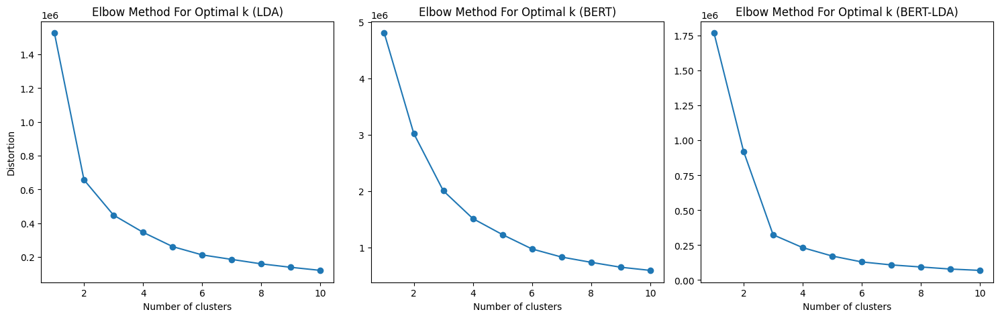

In [ ]:
# Assuming the BERT embeddings are stored in the variable `embeddings`
umap_bert = umap.UMAP().fit_transform(embeddings)

# Now, compute the Elbow plots
distortions_lda = compute_elbow(umap_lda, 10)
distortions_bert = compute_elbow(umap_bert, 10)
distortions_bert_lda = compute_elbow(reduced_umap, 10)

# And plot them
plt.figure(figsize=(15,5))
plt.subplot(1, 3, 1)
plt.plot(range(1, 11), distortions_lda, marker='o')
plt.title('Elbow Method For Optimal k (LDA)')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')

plt.subplot(1, 3, 2)
plt.plot(range(1, 11), distortions_bert, marker='o')
plt.title('Elbow Method For Optimal k (BERT)')
plt.xlabel('Number of clusters')

plt.subplot(1, 3, 3)
plt.plot(range(1, 11), distortions_bert_lda, marker='o')
plt.title('Elbow Method For Optimal k (BERT-LDA)')
plt.xlabel('Number of clusters')
plt.tight_layout()
plt.show()


Based on the "Elbow Method" graphs you provided:

1. For LDA: The optimal number of clusters seems to be around 3.
2. For BERT: The optimal number of clusters appears to be 3.
3. For BERT-LDA: The optimal number of clusters looks to be around 3.


BERT-LDA

In [3]:
pip install umap-learn


In [2]:
pip install transformers

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


BER-LDA

In [16]:
import numpy as np
import pandas as pd
import ast
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from transformers import BertTokenizer

# Load the dataset
data = pd.read_csv('/content/drive/My Drive/clustered_recipe.csv')

# Drop rows where 'preprocessed_full_recipe' is NaN
data.dropna(subset=['preprocessed_full_recipe'], inplace=True)
def string_to_list(embedding_str):
    try:
        return ast.literal_eval(embedding_str)
    except:
        return [float(x) for x in embedding_str.strip('[]').split()]

# Convert the embeddings from string to list format
embeddings = [string_to_list(embedding) for embedding in data['averaged_embedding']]

# Tokenise recipes for LDA
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
filtered_recipes = data['preprocessed_full_recipe'].dropna().astype(str).tolist()
texts = [tokenizer.tokenize(recipe) for recipe in filtered_recipes]
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# LDA topic modelling
num_topics = 25
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=15)
lda_topics = [lda_model.get_document_topics(doc) for doc in corpus]

# Combine LDA topics with BERT embeddings
embedding_size = len(embeddings[0])

def topic_prob_to_array(topic_prob):
    arr = np.zeros(embedding_size)
    topic_arr = np.zeros(num_topics)
    for topic, prob in topic_prob:
        topic_arr[topic] = prob
    arr[:num_topics] = topic_arr
    return arr

lda_bert_combined = [(topic_prob_to_array(topic_prob) + np.array(embeddings[index])) / 2 for index, topic_prob in enumerate(lda_topics)]

# Dimensionality Reduction
pca = PCA(n_components=20)
reduced_pca = pca.fit_transform(lda_bert_combined)

tsne = TSNE(n_components=2)
reduced_tsne = tsne.fit_transform(np.array(lda_bert_combined))

umap_reducer = umap.UMAP(
    n_neighbors=20,    # Start with a moderate value
    min_dist=0.1,      # Allow clusters to form without merging distinct themes
    spread=1.0,        # Default value, can be adjusted as needed
    metric='cosine'    # Given the nature of embeddings, cosine might be a good choice
)

reduced_umap = umap_reducer.fit_transform(lda_bert_combined)


# Clustering
kmeans_pca = KMeans(n_clusters=3).fit(reduced_pca)
kmeans_tsne = KMeans(n_clusters=3).fit(reduced_tsne)
kmeans_umap = KMeans(n_clusters=3).fit(reduced_umap)

# Add results to dataset
data['PCA_x'] = reduced_pca[:, 0]
data['PCA_y'] = reduced_pca[:, 1]
data['PCA_cluster'] = kmeans_pca.labels_

data['TSNE_x'] = reduced_tsne[:, 0]
data['TSNE_y'] = reduced_tsne[:, 1]
data['TSNE_cluster'] = kmeans_tsne.labels_

data['UMAP_x'] = reduced_umap[:, 0]
data['UMAP_y'] = reduced_umap[:, 1]
data['UMAP_cluster'] = kmeans_umap.labels_

# Save updated dataset to CSV
data.to_csv('/content/drive/My Drive/updated_clustered_recipe.csv', index=False)

# Compute Silhouette Score
sil_pca = silhouette_score(reduced_pca, kmeans_pca.labels_)
sil_tsne = silhouette_score(reduced_tsne, kmeans_tsne.labels_)
sil_umap = silhouette_score(reduced_umap, kmeans_umap.labels_)

silhouette_scores = {
    "Dimensionality Reduction Method": ["PCA", "t-SNE", "UMAP"],
    "Silhouette Score": [sil_pca, sil_tsne, sil_umap]
}

# Display results
print("Results for BERT-LDA embeddings:")
silhouette_scores_df = pd.DataFrame(silhouette_scores)
print(silhouette_scores_df)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Results for BERT-LDA embeddings:
  Dimensionality Reduction Method  Silhouette Score
0                             PCA          0.182460
1                           t-SNE          0.384498
2                            UMAP          0.578179


In [12]:
import numpy as np
import pandas as pd
import ast
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from transformers import BertTokenizer

# Load the dataset
data = pd.read_csv('/content/drive/My Drive/clustered_recipe.csv')
# Drop rows where 'preprocessed_full_recipe' is NaN
data.dropna(subset=['preprocessed_full_recipe'], inplace=True)
def string_to_list(embedding_str):
    try:
        return ast.literal_eval(embedding_str)
    except:
        return [float(x) for x in embedding_str.strip('[]').split()]

# Convert the embeddings from string to list format
embeddings = [string_to_list(embedding) for embedding in data['averaged_embedding']]

# Tokenise recipes for LDA
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
filtered_recipes = data['preprocessed_full_recipe'].dropna().astype(str).tolist()
texts = [tokenizer.tokenize(recipe) for recipe in filtered_recipes]
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# LDA topic modelling
num_topics = 20
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=15)
lda_topics = [lda_model.get_document_topics(doc) for doc in corpus]

# Combine LDA topics with BERT embeddings
embedding_size = len(embeddings[0])

def topic_prob_to_array(topic_prob):
    arr = np.zeros(embedding_size)
    topic_arr = np.zeros(num_topics)
    for topic, prob in topic_prob:
        topic_arr[topic] = prob
    arr[:num_topics] = topic_arr
    return arr

lda_bert_combined = [(topic_prob_to_array(topic_prob) + np.array(embeddings[index])) / 2 for index, topic_prob in enumerate(lda_topics)]

# Dimensionality Reduction
pca = PCA(n_components=20)
reduced_pca = pca.fit_transform(lda_bert_combined)

tsne = TSNE(n_components=2)
reduced_tsne = tsne.fit_transform(np.array(lda_bert_combined))

umap_reducer = umap.UMAP(
    n_neighbors=20,    # Start with a moderate value
    min_dist=0.1,      # Allow clusters to form without merging distinct themes
    spread=1.0,        # Default value, can be adjusted as needed
    metric='cosine'    # Given the nature of embeddings, cosine might be a good choice
)

reduced_umap = umap_reducer.fit_transform(lda_bert_combined)


# Clustering
kmeans_pca = KMeans(n_clusters=3).fit(reduced_pca)
kmeans_tsne = KMeans(n_clusters=3).fit(reduced_tsne)
kmeans_umap = KMeans(n_clusters=3).fit(reduced_umap)

# Add results to dataset
data['PCA_x'] = reduced_pca[:, 0]
data['PCA_y'] = reduced_pca[:, 1]
data['PCA_cluster'] = kmeans_pca.labels_

data['TSNE_x'] = reduced_tsne[:, 0]
data['TSNE_y'] = reduced_tsne[:, 1]
data['TSNE_cluster'] = kmeans_tsne.labels_

data['UMAP_x'] = reduced_umap[:, 0]
data['UMAP_y'] = reduced_umap[:, 1]
data['UMAP_cluster'] = kmeans_umap.labels_

# Save updated dataset to CSV
data.to_csv('/content/drive/My Drive/updated_clustered_recipe.csv', index=False)

# Compute Silhouette Score
sil_pca = silhouette_score(reduced_pca, kmeans_pca.labels_)
sil_tsne = silhouette_score(reduced_tsne, kmeans_tsne.labels_)
sil_umap = silhouette_score(reduced_umap, kmeans_umap.labels_)

silhouette_scores = {
    "Dimensionality Reduction Method": ["PCA", "t-SNE", "UMAP"],
    "Silhouette Score": [sil_pca, sil_tsne, sil_umap]
}

# Display results
print("Results for BERT-LDA embeddings:")
silhouette_scores_df = pd.DataFrame(silhouette_scores)
print(silhouette_scores_df)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Results for BERT-LDA embeddings:
  Dimensionality Reduction Method  Silhouette Score
0                             PCA          0.163447
1                           t-SNE          0.383951
2                            UMAP          0.599727


In [13]:
import numpy as np
import pandas as pd
import ast
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Load the dataset
data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')
# Drop rows where 'preprocessed_full_recipe' is NaN
data.dropna(subset=['preprocessed_full_recipe'], inplace=True)

def string_to_list(embedding_str):
    try:
        return ast.literal_eval(embedding_str)
    except:
        return [float(x) for x in embedding_str.strip('[]').split()]

# Convert the embeddings from string to list format
bert_embeddings = [string_to_list(embedding) for embedding in data['averaged_embedding']]

# Dimensionality Reduction
pca = PCA(n_components=20)
reduced_pca = pca.fit_transform(bert_embeddings)

tsne = TSNE(n_components=2)
reduced_tsne = tsne.fit_transform(np.array(bert_embeddings))

umap_reducer = umap.UMAP(
    n_neighbors=20,    # Start with a moderate value
    min_dist=0.1,      # Allow clusters to form without merging distinct themes
    spread=1.0,        # Default value, can be adjusted as needed
    metric='cosine'    # Given the nature of embeddings, cosine might be a good choice
)

reduced_umap = umap_reducer.fit_transform(bert_embeddings)

# Clustering
kmeans_pca = KMeans(n_clusters=3).fit(reduced_pca)
kmeans_tsne = KMeans(n_clusters=3).fit(reduced_tsne)
kmeans_umap = KMeans(n_clusters=3).fit(reduced_umap)

# Add results to dataset
data['PCA_x_bert'] = reduced_pca[:, 0]
data['PCA_y_bert'] = reduced_pca[:, 1]
data['PCA_cluster_bert'] = kmeans_pca.labels_

data['TSNE_x_bert'] = reduced_tsne[:, 0]
data['TSNE_y_bert'] = reduced_tsne[:, 1]
data['TSNE_cluster_bert'] = kmeans_tsne.labels_

data['UMAP_x_bert'] = reduced_umap[:, 0]
data['UMAP_y_bert'] = reduced_umap[:, 1]
data['UMAP_cluster_bert'] = kmeans_umap.labels_

# Save updated dataset to CSV
data.to_csv('/content/drive/My Drive/updated_clustered_recipe.csv', index=False)

# Compute Silhouette Score
sil_pca = silhouette_score(reduced_pca, kmeans_pca.labels_)
sil_tsne = silhouette_score(reduced_tsne, kmeans_tsne.labels_)
sil_umap = silhouette_score(reduced_umap, kmeans_umap.labels_)

silhouette_scores = {
    "Dimensionality Reduction Method": ["PCA", "t-SNE", "UMAP"],
    "Silhouette Score": [sil_pca, sil_tsne, sil_umap]
}

# Display results
print("Results for BERT embeddings:")
silhouette_scores_df = pd.DataFrame(silhouette_scores)
print(silhouette_scores_df)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Results for BERT embeddings:
  Dimensionality Reduction Method  Silhouette Score
0                             PCA          0.496537
1                           t-SNE          0.369101
2                            UMAP          0.368092


BERT

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Results for BERT embeddings:
  Dimensionality Reduction Method  Silhouette Score  Davies-Bouldin Index  \
0                             PCA          0.496667              0.692409   
1                           t-SNE          0.369102              0.874603   
2                            UMAP          0.365219              0.884391   

   Calinski-Harabasz Index  
0             77945.750780  
1             36679.435634  
2             36508.726023  
Dimensionality Reduction Method:
  PCA
t-SNE
 UMAP


Silhouette Score:
0.496667
0.369102
0.365219


Davies-Bouldin Index:
0.692409
0.874603
0.884391


Calinski-Harabasz Index:
77945.750780
36679.435634
36508.726023




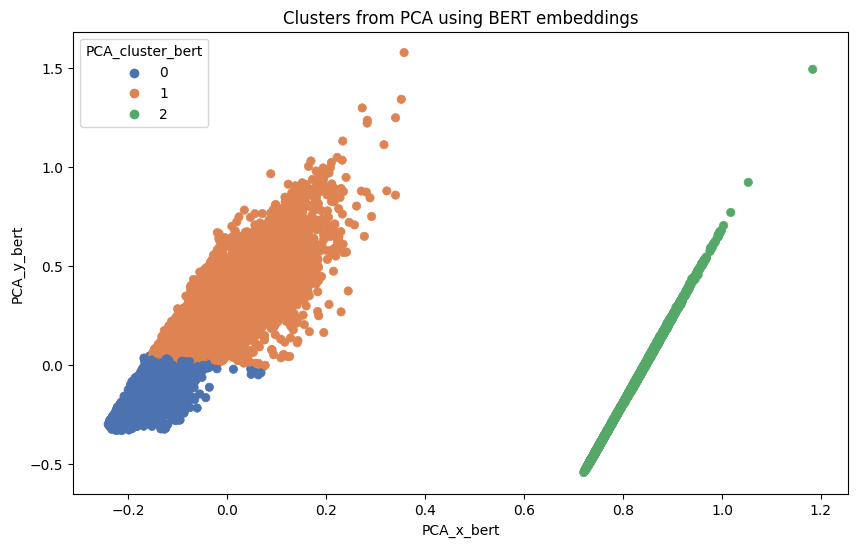

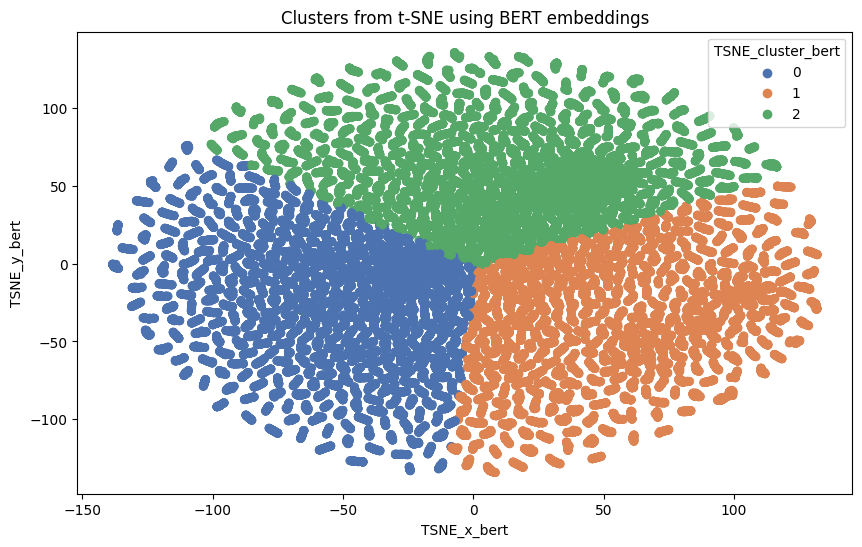

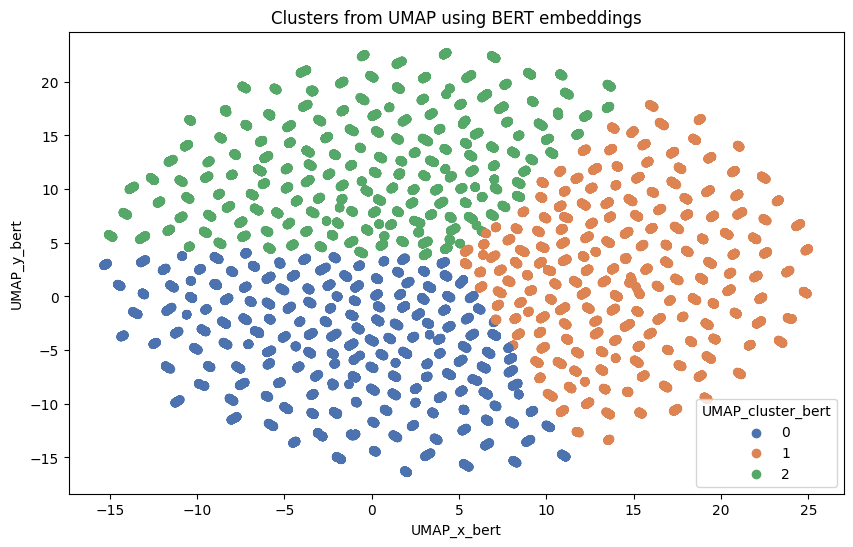

In [30]:
import numpy as np
import pandas as pd
import ast
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score


# Load the dataset
data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')

# Drop rows where 'preprocessed_full_recipe' is NaN
data.dropna(subset=['preprocessed_full_recipe'], inplace=True)

def string_to_list(embedding_str):
    try:
        return ast.literal_eval(embedding_str)
    except:
        return [float(x) for x in embedding_str.strip('[]').split()]

# Convert the embeddings from string to list format
bert_embeddings = [string_to_list(embedding) for embedding in data['averaged_embedding']]

# Dimensionality Reduction
pca = PCA(n_components=20)
reduced_pca = pca.fit_transform(bert_embeddings)

tsne = TSNE(n_components=2)
reduced_tsne = tsne.fit_transform(np.array(bert_embeddings))

umap_reducer_3 = umap.UMAP(
    n_neighbors=30,     # Midway between prioritising local and global.
    min_dist=0.075,     # Balance between tight and spread-out clusters.
    spread=1.2,         # Slightly larger spread than original.
    metric='cosine'
)


reduced_umap = umap_reducer.fit_transform(bert_embeddings)

# Clustering
kmeans_pca = KMeans(n_clusters=3).fit(reduced_pca)
kmeans_tsne = KMeans(n_clusters=3).fit(reduced_tsne)
kmeans_umap = KMeans(n_clusters=3).fit(reduced_umap)

# Add results to dataset
data['PCA_x_bert'] = reduced_pca[:, 0]
data['PCA_y_bert'] = reduced_pca[:, 1]
data['PCA_cluster_bert'] = kmeans_pca.labels_

data['TSNE_x_bert'] = reduced_tsne[:, 0]
data['TSNE_y_bert'] = reduced_tsne[:, 1]
data['TSNE_cluster_bert'] = kmeans_tsne.labels_

data['UMAP_x_bert'] = reduced_umap[:, 0]
data['UMAP_y_bert'] = reduced_umap[:, 1]
data['UMAP_cluster_bert'] = kmeans_umap.labels_

# Save updated dataset to CSV
data.to_csv('/content/drive/My Drive/updated_clustered_recipe.csv', index=False)

# Compute Silhouette Score
sil_pca = silhouette_score(reduced_pca, kmeans_pca.labels_)
sil_tsne = silhouette_score(reduced_tsne, kmeans_tsne.labels_)
sil_umap = silhouette_score(reduced_umap, kmeans_umap.labels_)

# Compute Davies-Bouldin Index
db_pca = davies_bouldin_score(reduced_pca, kmeans_pca.labels_)
db_tsne = davies_bouldin_score(reduced_tsne, kmeans_tsne.labels_)
db_umap = davies_bouldin_score(reduced_umap, kmeans_umap.labels_)

# Compute Calinski-Harabasz Index
ch_pca = calinski_harabasz_score(reduced_pca, kmeans_pca.labels_)
ch_tsne = calinski_harabasz_score(reduced_tsne, kmeans_tsne.labels_)
ch_umap = calinski_harabasz_score(reduced_umap, kmeans_umap.labels_)

# Add these scores to dictionary or print them directly.
scores_data_bert = pd.DataFrame({
    "Dimensionality Reduction Method": ["PCA", "t-SNE", "UMAP"],
    "Silhouette Score": [sil_pca, sil_tsne, sil_umap],
    "Davies-Bouldin Index": [db_pca, db_tsne, db_umap],
    "Calinski-Harabasz Index": [ch_pca, ch_tsne, ch_umap]
})


print("Results for BERT embeddings:")
print(scores_data_bert)
# Print each column of scores_data_lda individually
for column in scores_data_bert.columns:
    print(column + ":")
    print(scores_data_bert[column].to_string(index=False))
    print("\n")

# Function to visualise the clusters
def plot_clusters(data, x_col, y_col, cluster_col, method, embedding_type):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=data, x=x_col, y=y_col, hue=cluster_col, palette="deep", edgecolor=None)
    plt.title(f'Clusters from {method} using {embedding_type} embeddings')
    plt.show()

# Visualising for BERT embeddings
plot_clusters(data, 'PCA_x_bert', 'PCA_y_bert', 'PCA_cluster_bert', 'PCA', 'BERT')
plot_clusters(data, 'TSNE_x_bert', 'TSNE_y_bert', 'TSNE_cluster_bert', 't-SNE', 'BERT')
plot_clusters(data, 'UMAP_x_bert', 'UMAP_y_bert', 'UMAP_cluster_bert', 'UMAP', 'BERT')



Results for BERT embeddings:
  Dimensionality Reduction Method  Silhouette Score  Davies-Bouldin Index  \
0                             PCA          0.496564              0.692596   
1                           t-SNE          0.369115              0.874345   
2                            UMAP          0.367446              0.876044   

   Calinski-Harabasz Index  
0             78001.759817  
1             36679.788877  
2             36960.967084  
Dimensionality Reduction Method:
  PCA
t-SNE
 UMAP


Silhouette Score:
0.496564
0.369115
0.367446


Davies-Bouldin Index:
0.692596
0.874345
0.876044


Calinski-Harabasz Index:
78001.759817
36679.788877
36960.967084




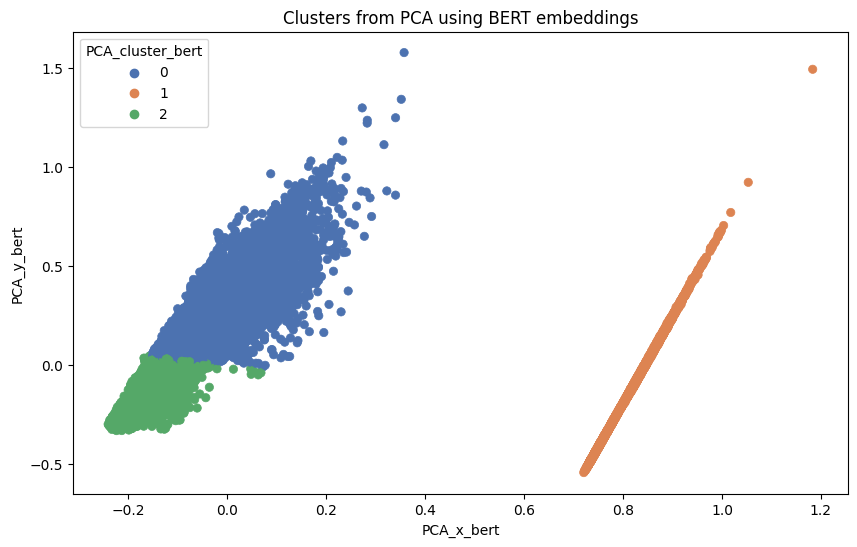

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


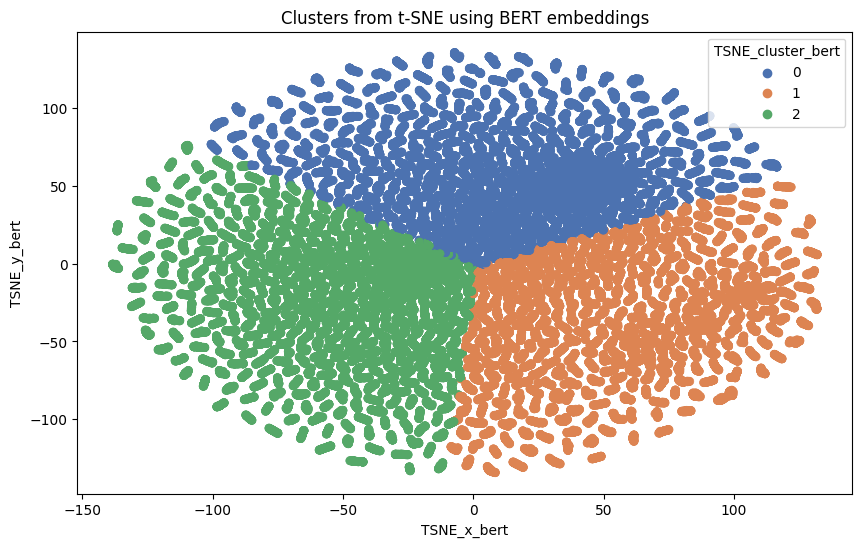

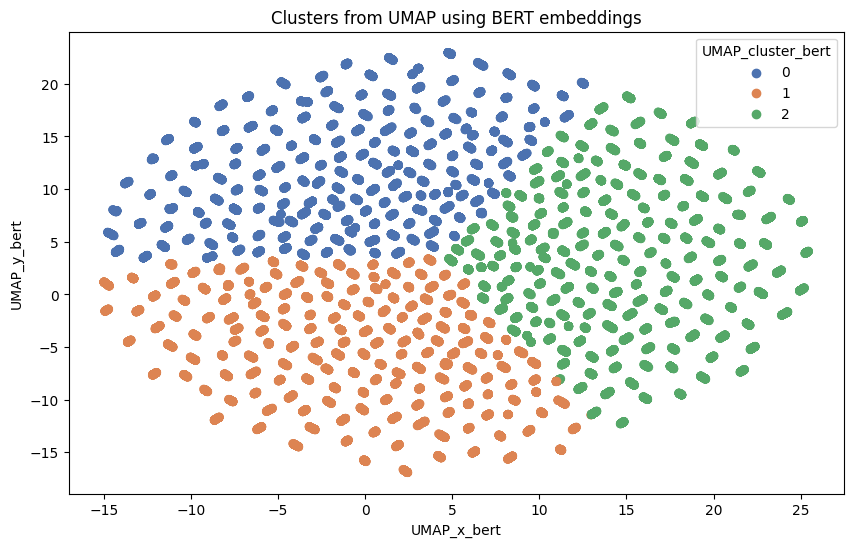

In [17]:
print("Results for BERT embeddings:")
print(scores_data_bert)
# Print each column of scores_data_lda individually
for column in scores_data_bert.columns:
    print(column + ":")
    print(scores_data_bert[column].to_string(index=False))
    print("\n")

# Function to visualise the clusters
def plot_clusters(data, x_col, y_col, cluster_col, method, embedding_type):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=data, x=x_col, y=y_col, hue=cluster_col, palette="deep", edgecolor=None)
    plt.title(f'Clusters from {method} using {embedding_type} embeddings')
    plt.show()

# Visualising for BERT embeddings
plot_clusters(data, 'PCA_x_bert', 'PCA_y_bert', 'PCA_cluster_bert', 'PCA', 'BERT')
plot_clusters(data, 'TSNE_x_bert', 'TSNE_y_bert', 'TSNE_cluster_bert', 't-SNE', 'BERT')
plot_clusters(data, 'UMAP_x_bert', 'UMAP_y_bert', 'UMAP_cluster_bert', 'UMAP', 'BERT')



In [19]:
# data.head()

FOR LDA

In [10]:
pip install umap-learn transformers


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 1.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 44.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 27.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 58.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 50.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 26.9 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86770 sha256=7bf879fecfa2f3aed6e251e0d73a472a18240636e24bc76fead630f193ca4635
  Stored in directory: /root/.cache/pip/wheels/fb/66/29/199acf5784d0f7b8add6d466175ab45506c96e386ed5dd0633
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55615 sh

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Results for LDA embeddings:
  Dimensionality Reduction Method  Silhouette Score  Davies-Bouldin Index  \
0                             PCA          0.195987              1.695571   
1                           t-SNE          0.383853              0.865595   
2                            UMAP          0.441901              0.838473   

   Calinski-Harabasz Index  
0              6595.182827  
1             39909.915703  
2             60059.934332  
Dimensionality Reduction Method:
  PCA
t-SNE
 UMAP


Silhouette Score:
0.195987
0.383853
0.441901


Davies-Bouldin Index:
1.695571
0.865595
0.838473


Calinski-Harabasz Index:
 6595.182827
39909.915703
60059.934332




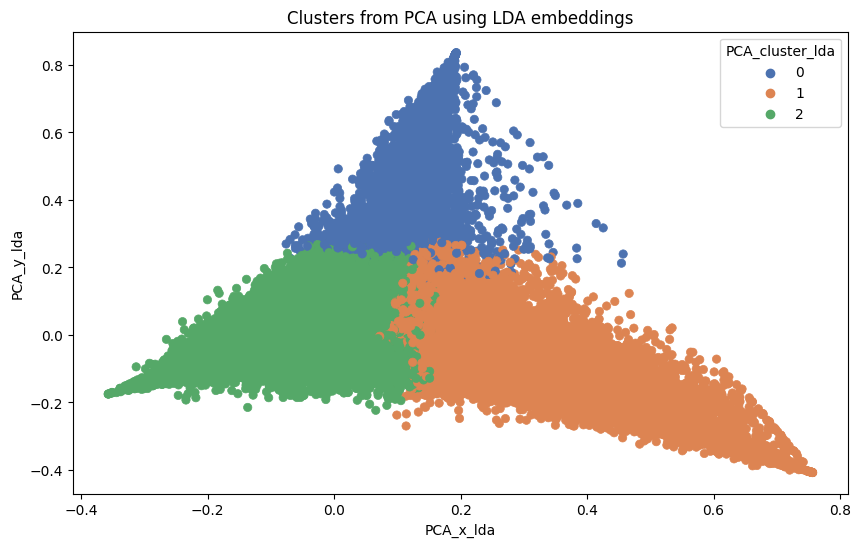

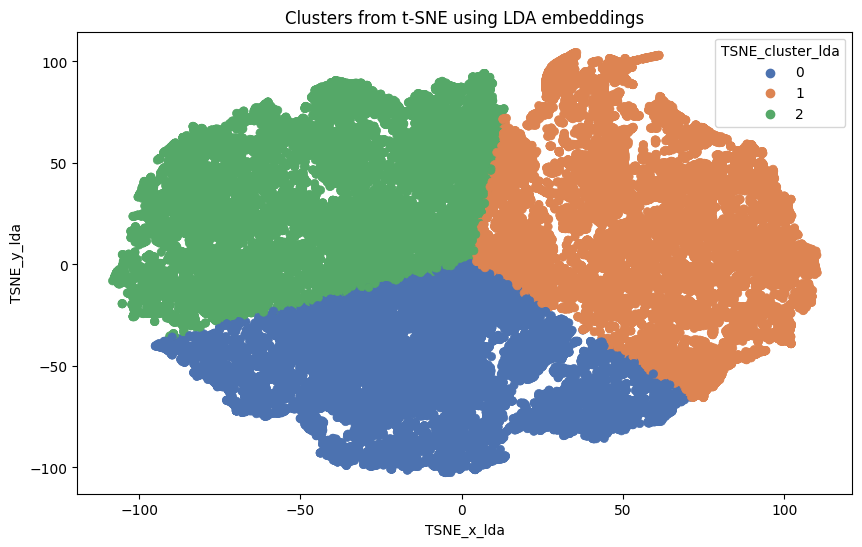

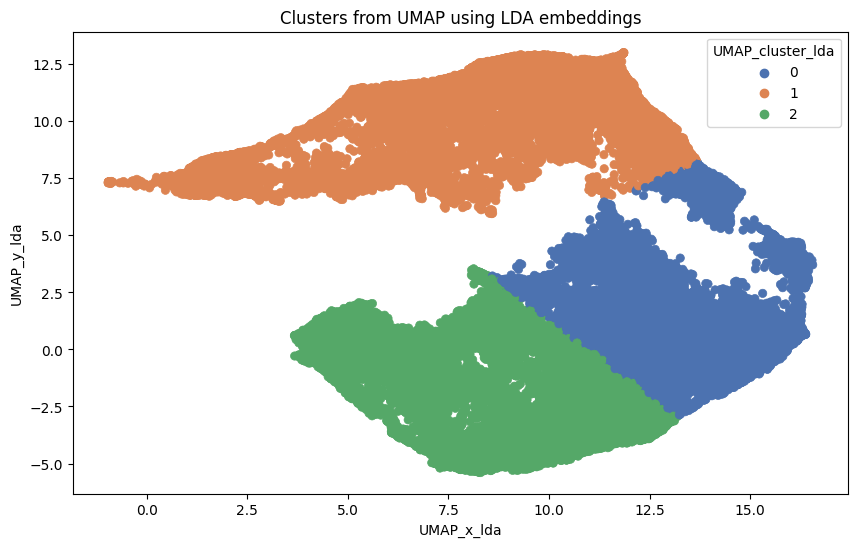

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from transformers import BertTokenizer
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score

# Load dataset
data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')

# Drop rows where 'preprocessed_full_recipe' is NaN
data.dropna(subset=['preprocessed_full_recipe'], inplace=True)

# Tokenise recipes for LDA
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
filtered_recipes = data['preprocessed_full_recipe'].dropna().astype(str).tolist()
texts = [tokenizer.tokenize(recipe) for recipe in filtered_recipes]
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# LDA topic modelling
num_topics = 20
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=15)
lda_topics = [lda_model.get_document_topics(doc) for doc in corpus]

# Assuming lda_topics contains the topic probabilities for each document
def topic_prob_to_array(topic_prob, num_topics):
    arr = np.zeros(num_topics)
    for topic, prob in topic_prob:
        arr[topic] = prob
    return arr

lda_embeddings = np.array([topic_prob_to_array(topic_prob, num_topics) for topic_prob in lda_topics])

# Dimensionality Reduction
pca = PCA(n_components=20)
reduced_pca = pca.fit_transform(lda_embeddings)


tsne = TSNE(n_components=2)
reduced_tsne = tsne.fit_transform(np.array(lda_embeddings))

umap_reducer = umap.UMAP(
    n_neighbors=30,
    min_dist=0.075,
    spread=1.2,
    metric='cosine'
)
reduced_umap = umap_reducer.fit_transform(lda_embeddings)

# Clustering
kmeans_pca = KMeans(n_clusters=3).fit(reduced_pca)
kmeans_tsne = KMeans(n_clusters=3).fit(reduced_tsne)
kmeans_umap = KMeans(n_clusters=3).fit(reduced_umap)

# Add results to dataset
data['PCA_x_lda'] = reduced_pca[:, 0]
data['PCA_y_lda'] = reduced_pca[:, 1]
data['PCA_cluster_lda'] = kmeans_pca.labels_

data['TSNE_x_lda'] = reduced_tsne[:, 0]
data['TSNE_y_lda'] = reduced_tsne[:, 1]
data['TSNE_cluster_lda'] = kmeans_tsne.labels_

data['UMAP_x_lda'] = reduced_umap[:, 0]
data['UMAP_y_lda'] = reduced_umap[:, 1]
data['UMAP_cluster_lda'] = kmeans_umap.labels_

# Save updated dataset to CSV
data.to_csv('/content/drive/My Drive/updated_clustered_recipe.csv', index=False)

# Compute Silhouette Score
sil_pca = silhouette_score(reduced_pca, kmeans_pca.labels_)
sil_tsne = silhouette_score(reduced_tsne, kmeans_tsne.labels_)
sil_umap = silhouette_score(reduced_umap, kmeans_umap.labels_)

# Compute Davies-Bouldin Index
db_pca = davies_bouldin_score(reduced_pca, kmeans_pca.labels_)
db_tsne = davies_bouldin_score(reduced_tsne, kmeans_tsne.labels_)
db_umap = davies_bouldin_score(reduced_umap, kmeans_umap.labels_)

# Compute Calinski-Harabasz Index
ch_pca = calinski_harabasz_score(reduced_pca, kmeans_pca.labels_)
ch_tsne = calinski_harabasz_score(reduced_tsne, kmeans_tsne.labels_)
ch_umap = calinski_harabasz_score(reduced_umap, kmeans_umap.labels_)

# Add these scores to dictionary or print them directly.
scores_data_lda = pd.DataFrame({
    "Dimensionality Reduction Method": ["PCA", "t-SNE", "UMAP"],
    "Silhouette Score": [sil_pca, sil_tsne, sil_umap],
    "Davies-Bouldin Index": [db_pca, db_tsne, db_umap],
    "Calinski-Harabasz Index": [ch_pca, ch_tsne, ch_umap]
})

print("Results for LDA embeddings:")
print(scores_data_lda)
# Print each column of scores_data_lda individually
for column in scores_data_lda.columns:
    print(column + ":")
    print(scores_data_lda[column].to_string(index=False))
    print("\n")

# Function to visualise the clusters
def plot_clusters(data, x_col, y_col, cluster_col, method):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=data, x=x_col, y=y_col, hue=cluster_col, palette="deep", edgecolor=None)
    plt.title(f'Clusters from {method} using LDA embeddings')
    plt.show()

# Visualising the clusters using PCA
plot_clusters(data, 'PCA_x_lda', 'PCA_y_lda', 'PCA_cluster_lda', 'PCA')

# Visualising the clusters using t-SNE
plot_clusters(data, 'TSNE_x_lda', 'TSNE_y_lda', 'TSNE_cluster_lda', 't-SNE')

# Visualising the clusters using UMAP
plot_clusters(data, 'UMAP_x_lda', 'UMAP_y_lda', 'UMAP_cluster_lda', 'UMAP')



BERT-LDA

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Results for BERT-LDA embeddings:
  Dimensionality Reduction Method  Silhouette Score  Davies-Bouldin Index  \
0                             PCA          0.167555              1.914880   
1                           t-SNE          0.400824              0.862537   
2                            UMAP          0.579857              0.534542   

   Calinski-Harabasz Index  
0             11824.500034  
1             43980.888679  
2            120266.518231  


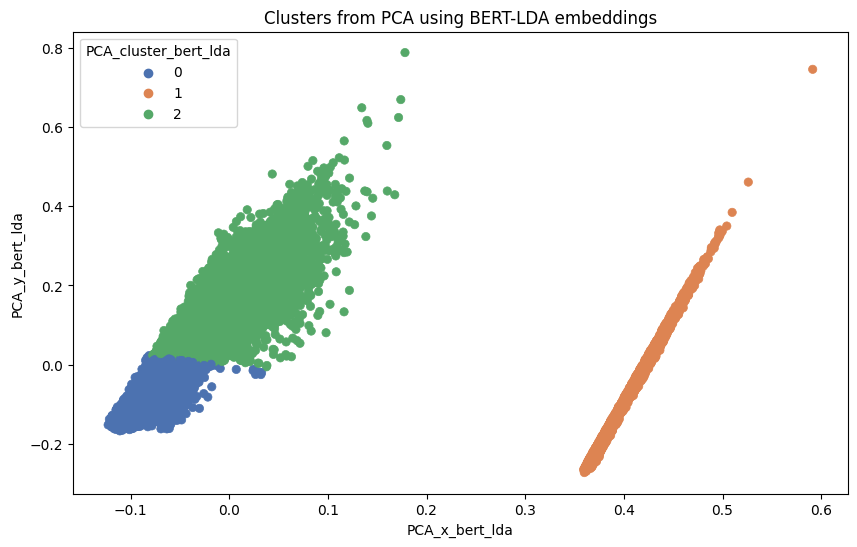

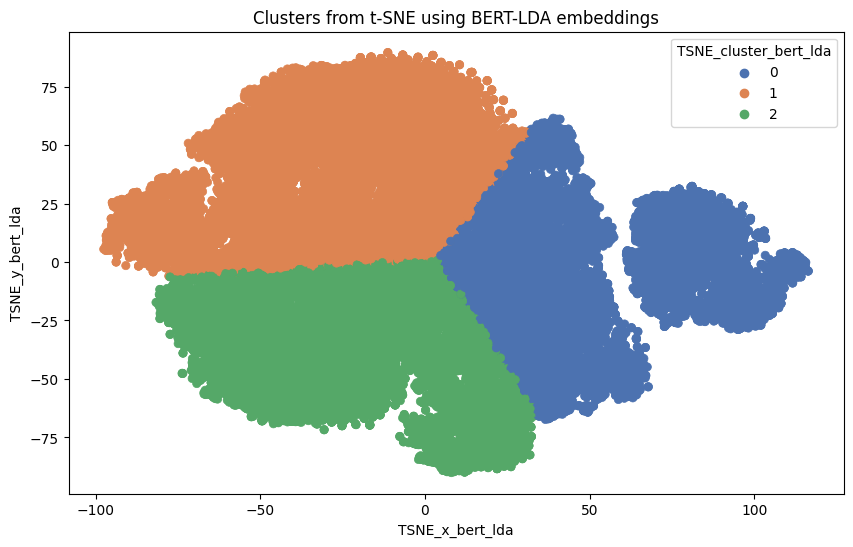

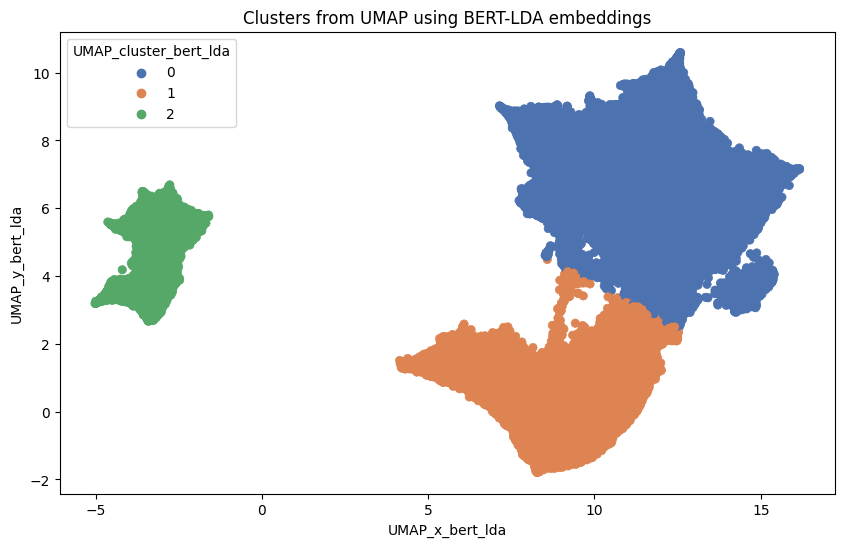

In [20]:
import numpy as np
import pandas as pd
import ast
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from transformers import BertTokenizer
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import davies_bouldin_score, calinski_harabasz_score



# Load the dataset
data = pd.read_csv('/content/drive/My Drive/clustered_recipe.csv')

# Drop rows where 'preprocessed_full_recipe' is NaN
data.dropna(subset=['preprocessed_full_recipe'], inplace=True)

def string_to_list(embedding_str):
    try:
        return ast.literal_eval(embedding_str)
    except:
        return [float(x) for x in embedding_str.strip('[]').split()]

# Convert the embeddings from string to list format
embeddings = [string_to_list(embedding) for embedding in data['averaged_embedding']]

# Tokenise recipes for LDA
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
filtered_recipes = data['preprocessed_full_recipe'].dropna().astype(str).tolist()
texts = [tokenizer.tokenize(recipe) for recipe in filtered_recipes]
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# LDA topic modelling
num_topics = 20
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, passes=15)
lda_topics = [lda_model.get_document_topics(doc) for doc in corpus]

# Combine LDA topics with BERT embeddings
embedding_size = len(embeddings[0])

def topic_prob_to_array(topic_prob):
    arr = np.zeros(embedding_size)
    topic_arr = np.zeros(num_topics)
    for topic, prob in topic_prob:
        topic_arr[topic] = prob
    arr[:num_topics] = topic_arr
    return arr

lda_bert_combined = [(topic_prob_to_array(topic_prob) + np.array(embeddings[index])) / 2 for index, topic_prob in enumerate(lda_topics)]

# Dimensionality Reduction
pca = PCA(n_components=20)
reduced_pca = pca.fit_transform(lda_bert_combined)

tsne = TSNE(n_components=2)
reduced_tsne = tsne.fit_transform(np.array(lda_bert_combined))

umap_reducer = umap.UMAP(
    n_neighbors=20,    # Start with a moderate value
    min_dist=0.1,      # Allow clusters to form without merging distinct themes
    spread=1.0,        # Default value, can be adjusted as needed
    metric='cosine'    # Given the nature of embeddings, cosine might be a good choice
)

reduced_umap = umap_reducer.fit_transform(lda_bert_combined)


# Clustering
kmeans_pca = KMeans(n_clusters=3).fit(reduced_pca)
kmeans_tsne = KMeans(n_clusters=3).fit(reduced_tsne)
kmeans_umap = KMeans(n_clusters=3).fit(reduced_umap)

# Add results to dataset
data['PCA_x_bert_lda'] = reduced_pca[:, 0]
data['PCA_y_bert_lda'] = reduced_pca[:, 1]
data['PCA_cluster_bert_lda'] = kmeans_pca.labels_

data['TSNE_x_bert_lda'] = reduced_tsne[:, 0]
data['TSNE_y_bert_lda'] = reduced_tsne[:, 1]
data['TSNE_cluster_bert_lda'] = kmeans_tsne.labels_

data['UMAP_x_bert_lda'] = reduced_umap[:, 0]
data['UMAP_y_bert_lda'] = reduced_umap[:, 1]
data['UMAP_cluster_bert_lda'] = kmeans_umap.labels_

# Save updated dataset to CSV
data.to_csv('/content/drive/My Drive/updated_clustered_recipe.csv', index=False)

# Compute Silhouette Score
sil_pca = silhouette_score(reduced_pca, kmeans_pca.labels_)
sil_tsne = silhouette_score(reduced_tsne, kmeans_tsne.labels_)
sil_umap = silhouette_score(reduced_umap, kmeans_umap.labels_)

# Compute Davies-Bouldin Index
db_pca = davies_bouldin_score(reduced_pca, kmeans_pca.labels_)
db_tsne = davies_bouldin_score(reduced_tsne, kmeans_tsne.labels_)
db_umap = davies_bouldin_score(reduced_umap, kmeans_umap.labels_)

# Compute Calinski-Harabasz Index
ch_pca = calinski_harabasz_score(reduced_pca, kmeans_pca.labels_)
ch_tsne = calinski_harabasz_score(reduced_tsne, kmeans_tsne.labels_)
ch_umap = calinski_harabasz_score(reduced_umap, kmeans_umap.labels_)

# Add these scores to dictionary or print them directly.
scores_data_bert_lda = pd.DataFrame({
    "Dimensionality Reduction Method": ["PCA", "t-SNE", "UMAP"],
    "Silhouette Score": [sil_pca, sil_tsne, sil_umap],
    "Davies-Bouldin Index": [db_pca, db_tsne, db_umap],
    "Calinski-Harabasz Index": [ch_pca, ch_tsne, ch_umap]
})

print("Results for BERT-LDA embeddings:")
print(scores_data_bert_lda)
# Print each column of scores_data_lda individually
for column in scores_data_bert_lda.columns:
    print(column + ":")
    print(scores_data_bert[column].to_string(index=False))
    print("\n")


# Function to visualise the clusters
def plot_clusters(data, x_col, y_col, cluster_col, method, embedding_type):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=data, x=x_col, y=y_col, hue=cluster_col, palette="deep", edgecolor=None)
    plt.title(f'Clusters from {method} using {embedding_type} embeddings')
    plt.show()


# Visualising for BERT-LDA embeddings
plot_clusters(data, 'PCA_x_bert_lda', 'PCA_y_bert_lda', 'PCA_cluster_bert_lda', 'PCA', 'BERT-LDA')
plot_clusters(data, 'TSNE_x_bert_lda', 'TSNE_y_bert_lda', 'TSNE_cluster_bert_lda', 't-SNE', 'BERT-LDA')
plot_clusters(data, 'UMAP_x_bert_lda', 'UMAP_y_bert_lda', 'UMAP_cluster_bert_lda', 'UMAP', 'BERT-LDA')


In [28]:
# import pandas as pd
# # Load the dataset
data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')
data.head()

,title,ingredients,directions,link,source,NER,site,preprocessed_ingredients,preprocessed_directions,full_recipe,...,UMAP_cluster_bert_lda,PCA_x_lda,PCA_y_lda,PCA_cluster_lda,TSNE_x_lda,TSNE_y_lda,TSNE_cluster_lda,UMAP_x_lda,UMAP_y_lda,UMAP_cluster_lda
0,Gazpacho,"['8 tomatoes, quartered', 'Kosher salt', '1 re...","['[""Add the tomatoes to a food processor with ...",www.foodnetwork.com/recipes/gazpacho1.html,Recipes1M,"[""yellow bell pepper"", ""extra-virgin olive oil...",www.foodnetwork.com,fine dice pepper kosher chop extra salt bell s...,pepper garnish chill food add chop combin salt...,"[""8 tomatoes, quartered"", ""Kosher salt"", ""1 re...",...,0,-0.256514,-0.088699,2,-101.630875,16.553587,2,10.461006,-4.660519,2
1,Rice Paper Wrapped Halibut Roasted with Foie G...,"['4 large, round rice wrappers', '4 (6-ounce) ...","['[""Spread foie mousse on each fillet and top ...",www.foodnetwork.com/recipes/rice-paper-wrapped...,Recipes1M,"[""egg"", ""gras"", ""ginger"", ""heavy cream"", ""hone...",www.foodnetwork.com,fine dice pepper long garnish deseed truffl ho...,pinot brown garnish vineyard honey sauc demi d...,"[""4 large, round rice wrappers"", ""4 (6-ounce) ...",...,0,-0.116153,-0.022086,2,-30.004013,-12.008592,0,9.993647,0.450036,2
2,Lemon Cupcakes with Blueberry Compote Filling ...,"['1 1/2 cups granulated sugar', '1 stick (1/2 ...","['[""For the cupcakes: Preheat the oven to 350 ...",www.foodnetwork.com/recipes/lemon-cupcakes-wit...,Recipes1M,"[""buttermilk"", ""sugar"", ""baking powder"", ""vani...",www.foodnetwork.com,extract soda blueberri vanilla flour purpos sa...,food blueberri mixtur insert begin refriger ju...,"[""1 1/2 cups granulated sugar"", ""1 stick (1/2 ...",...,1,0.534698,-0.134055,1,83.389940,-18.441854,1,10.925166,11.591702,1
3,Soft Pretzels with Queso Poblano Sauce and Mus...,"['1 tablespoon unsalted butter', '1 tablespoon...","['[""Melt the butter in a medium saucepan over ...",www.foodnetwork.com/recipes/bobby-flay/soft-pr...,Recipes1M,"[""dijon mustard"", ""salt"", ""active dry yeast"", ...",www.foodnetwork.com,pepper soda brown activ kosher monterey jack h...,boil cover long brown equal honey slightli she...,"[""1 tablespoon unsalted butter"", ""1 tablespoon...",...,1,0.151813,-0.062165,1,43.965210,-56.697132,0,13.230431,7.841386,1
4,Sweet Biscuit Wreath,"['1/2 cup sugar', '1 tablespoon pumpkin pie sp...","['[""Preheat oven to 350 degrees F', '"", ""On a ...",www.foodnetwork.com/recipes/sandra-lee/sweet-b...,Recipes1M,"[""egg"", ""sugar"", ""powdered sugar"", ""water"", ""m...",www.foodnetwork.com,cinnamon spice egg ground ounc water refriger ...,cutter cover bottom cinnamon move roll sprinkl...,"[""1/2 cup sugar"", ""1 tablespoon pumpkin pie sp...",...,1,0.349421,-0.150987,1,73.890550,-60.701980,1,13.056587,9.456496,1


In [31]:
print(data.columns)


Index(['title', 'ingredients', 'directions', 'link', 'source', 'NER', 'site',
       'preprocessed_ingredients', 'preprocessed_directions', 'full_recipe',
       'preprocessed_full_recipe', 'quantities', 'units',
       'cleaned_ingredients', 'standardized_ingredients', 'averaged_embedding',
       'duration', 'most_similar_recipes', 'Step_Complexity',
       'Technique_Diversity', 'Ingredient_Diversity', 'Total_Complexity',
       'Difficulty_Level', 'cluster_label', 'most_similar_recipe_index',
       'combined_most_similar_recipe', 'cluster', 'similar_recipes_count',
       'PCA_x_bert_lda', 'PCA_y_bert_lda', 'PCA_cluster_bert_lda',
       'TSNE_x_bert_lda', 'TSNE_y_bert_lda', 'TSNE_cluster_bert_lda',
       'UMAP_x_bert_lda', 'UMAP_y_bert_lda', 'UMAP_cluster_bert_lda',
       'PCA_x_lda', 'PCA_y_lda', 'PCA_cluster_lda', 'TSNE_x_lda', 'TSNE_y_lda',
       'TSNE_cluster_lda', 'UMAP_x_lda', 'UMAP_y_lda', 'UMAP_cluster_lda',
       'PCA_x_bert', 'PCA_y_bert', 'PCA_cluster_bert', 'TSNE_

In [33]:
import pandas as pd

# 1. Load data
data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')

# 2. Basic Statistics
# For BERT with PCA
print("BERT with PCA Cluster Distribution:")
print(data['PCA_cluster_bert'].value_counts())   # Adjusting column name for BERT with PCA

# For BERT-LDA with UMAP
print("\nBERT-LDA with UMAP Cluster Distribution:")
print(data['UMAP_cluster_bert_lda'].value_counts())

# For LDA with UMAP
print("\nLDA with UMAP Cluster Distribution:")
print(data['UMAP_cluster_lda'].value_counts())

# 3. Sample & Inspect
# Sampling 5 recipes from each cluster in BERT with PCA for inspection
print("\nSample recipes from BERT with PCA clusters:")
for cluster in data['PCA_cluster_bert'].unique():
    print(f"\nCluster {cluster}:")
    sample_recipes = data[data['PCA_cluster_bert'] == cluster]['preprocessed_full_recipe'].sample(5)
    for index, recipe in sample_recipes.iteritems():
        print(f"- {recipe}")

# Sampling 5 recipes from each cluster in BERT-LDA with UMAP for inspection
print("\nSample recipes from BERT-LDA with UMAP clusters:")
for cluster in data['UMAP_cluster_bert_lda'].unique():
    print(f"\nCluster {cluster}:")
    sample_recipes = data[data['UMAP_cluster_bert_lda'] == cluster]['preprocessed_full_recipe'].sample(5)
    for index, recipe in sample_recipes.iteritems():
        print(f"- {recipe}")

# Sampling 5 recipes from each cluster in LDA with UMAP for inspection
print("\nSample recipes from LDA with UMAP clusters:")
for cluster in data['UMAP_cluster_lda'].unique():
    print(f"\nCluster {cluster}:")
    sample_recipes = data[data['UMAP_cluster_lda'] == cluster]['preprocessed_full_recipe'].sample(5)
    for index, recipe in sample_recipes.iteritems():
        print(f"- {recipe}")

# 4. Common Themes: This requires manual inspection based on the sampled recipes.
# Look for patterns or common ingredients, preparation methods, or cuisines.


BERT with PCA Cluster Distribution:
0    22414
1    21185
2     5840
Name: PCA_cluster_bert, dtype: int64

BERT-LDA with UMAP Cluster Distribution:
0    30436
1    13163
2     5840
Name: UMAP_cluster_bert_lda, dtype: int64

LDA with UMAP Cluster Distribution:
2    18569
0    16314
1    14556
Name: UMAP_cluster_lda, dtype: int64

Sample recipes from BERT with PCA clusters:

Cluster 1:
- pepper spring fennel bulb mullet sauc ground salt goat blanch ounc gram radish babi follow black juic lemon medium tablespoon carrot romesco green oil fish freshli bean recip oliv onion food unpeel sheet sauc ground roast bell ounc hand mandolin insid refriger juic pine keep freshli fillet recip let oliv wine proport garlic thi core network clove pepper scale restaur chop mullet cook gentli press set kitchen fresh wash dress tablespoon side peel veget oil flat almond represent add minut open grill salt provid option gram nut vinegar black degre indic mix use carrot romesco jar parsley anchovi slice knife

<ipython-input-33-ff189388e351>:25: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, recipe in sample_recipes.iteritems():


- pepper brown extra egg salt bell larg small amount potato thinli virgin medium moon eyebal peel beaten slice seed halv russet sack across paper oliv onion cooki return pepper bottom brown skillet slide add minut sheet slightli heat cook high remov wipe half extra egg mixtur stand salt begin bake tightli slot remain tender seal plate wedg potato skin becom away place virgin medium char nonstick cool spoon use leav settl broiler allow oil peel veget transfer beaten slice blacken serv reduc bowl work puff sack preheat paper season oliv onion
- pepper adobo honey chop sauc ground horseradish grill salt cilantro larg chipotl black juic plum heap beefsteak teaspoon lime tablespoon dash prepar shrimp oil freshli leaf worcestershir tomato halv oliv pepper food honey slightli heat brush process horseradish grill salt cilantro chipotl smooth processor juic place char lime touch shrimp oliv serv worcestershir tomato season high soft
- pound pepper veal eggplant chop flour lightli fri inch purpo

<ipython-input-33-ff189388e351>:33: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, recipe in sample_recipes.iteritems():
<ipython-input-33-ff189388e351>:41: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, recipe in sample_recipes.iteritems():


- pound core cinnamon rhubarb brown equal chill piec chop flour trim inch purpos brandi ground solid salt pinch bleach water cherri follow cornstarch cup juic lemon fresh pack teaspoon shorten thick tablespoon sugar butter nutmeg walnut cold grape piecrust unsalt grate peel basic light veget freshli mcintosh slice appl recip granul sweet rhubarb brown wide toss mixtur least hand refriger evenli juic medium crimp nutmeg sugar crumb deep transfer round circl fruit coat cinnamon flour lightli gentli larg press water remain plastic overhang golden butter walnut rack wrap pan bowl appl flute roll add minut trim inch fill salt coars pour lift degre thick mix use fork ball bubbl form complet piecrust preheat fingertip tear soft unfold sprinkl remov brandi combin bake dish either cornstarch oven edg lemon care diamet shorten cool resembl surfac serv wire togeth dough work well fold
- pound cinnamon clove honey sheet inch ground water coars cup lemon pistachio teaspoon thick tablespoon sugar bu

In [34]:
import pandas as pd

# Load the data
data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')

# Display the column names
print(data.columns)


Index(['title', 'ingredients', 'directions', 'link', 'source', 'NER', 'site',
       'preprocessed_ingredients', 'preprocessed_directions', 'full_recipe',
       'preprocessed_full_recipe', 'quantities', 'units',
       'cleaned_ingredients', 'standardized_ingredients', 'averaged_embedding',
       'duration', 'most_similar_recipes', 'Step_Complexity',
       'Technique_Diversity', 'Ingredient_Diversity', 'Total_Complexity',
       'Difficulty_Level', 'cluster_label', 'most_similar_recipe_index',
       'combined_most_similar_recipe', 'cluster', 'similar_recipes_count',
       'PCA_x_bert_lda', 'PCA_y_bert_lda', 'PCA_cluster_bert_lda',
       'TSNE_x_bert_lda', 'TSNE_y_bert_lda', 'TSNE_cluster_bert_lda',
       'UMAP_x_bert_lda', 'UMAP_y_bert_lda', 'UMAP_cluster_bert_lda',
       'PCA_x_lda', 'PCA_y_lda', 'PCA_cluster_lda', 'TSNE_x_lda', 'TSNE_y_lda',
       'TSNE_cluster_lda', 'UMAP_x_lda', 'UMAP_y_lda', 'UMAP_cluster_lda',
       'PCA_x_bert', 'PCA_y_bert', 'PCA_cluster_bert', 'TSNE_

In [ ]:
# Add cluster assignments to the DataFrame
data['clusters_pca_lda'] = kmeans_pca_lda.labels_
data['clusters_tsne_lda'] = kmeans_tsne_lda.labels_
data['clusters_umap_lda'] = kmeans_umap_lda.labels_

data['clusters_pca_bert'] = kmeans_pca_bert.labels_
data['clusters_tsne_bert'] = kmeans_tsne_bert.labels_
data['clusters_umap_bert'] = kmeans_umap_bert.labels_

data['clusters_pca_bert_lda'] = kmeans_pca.labels_
data['clusters_tsne_bert_lda'] = kmeans_tsne.labels_
data['clusters_umap_bert_lda'] = kmeans_umap.labels_

# Export the updated DataFrame to a new CSV file
data.to_csv('/content/drive/My Drive/clustered_recipe_with_labels.csv', index=False)

Clustering Plots:
We'll use matplotlib to produce scatter plots for each method.

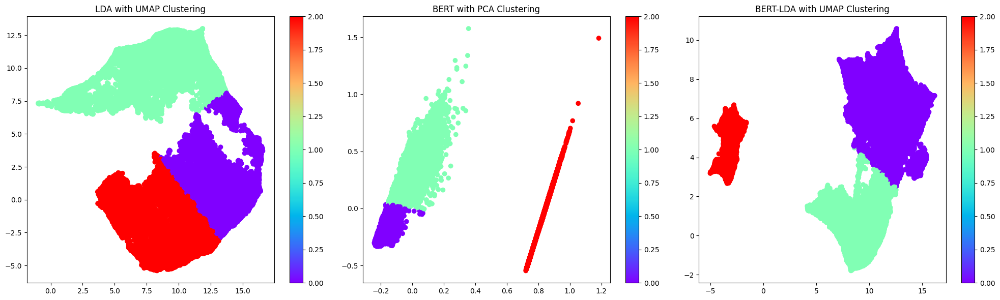

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming you've already loaded the data
# data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')

# Extracting UMAP coordinates and labels for each technique
umap_lda = data[['UMAP_x_lda', 'UMAP_y_lda']].values
umap_lda_labels = data['UMAP_cluster_lda']

umap_bert = data[['PCA_x_bert', 'PCA_y_bert']].values
umap_bert_labels = data['PCA_cluster_bert']

umap_bert_lda = data[['UMAP_x_bert_lda', 'UMAP_y_bert_lda']].values
umap_bert_lda_labels = data['UMAP_cluster_bert_lda']

# Plotting

fig, axs = plt.subplots(1, 3, figsize=(20, 6))

# LDA with UMAP
sc1 = axs[0].scatter(umap_lda[:, 0], umap_lda[:, 1], c=umap_lda_labels, cmap='rainbow')
axs[0].set_title('LDA with UMAP Clustering')
fig.colorbar(sc1, ax=axs[0])

# BERT with PCA
sc2 = axs[1].scatter(umap_bert[:, 0], umap_bert[:, 1], c=umap_bert_labels, cmap='rainbow')
axs[1].set_title('BERT with PCA Clustering')
fig.colorbar(sc2, ax=axs[1])

# BERT-LDA with UMAP
sc3 = axs[2].scatter(umap_bert_lda[:, 0], umap_bert_lda[:, 1], c=umap_bert_lda_labels, cmap='rainbow')
axs[2].set_title('BERT-LDA with UMAP Clustering')
fig.colorbar(sc3, ax=axs[2])

plt.tight_layout()
plt.show()


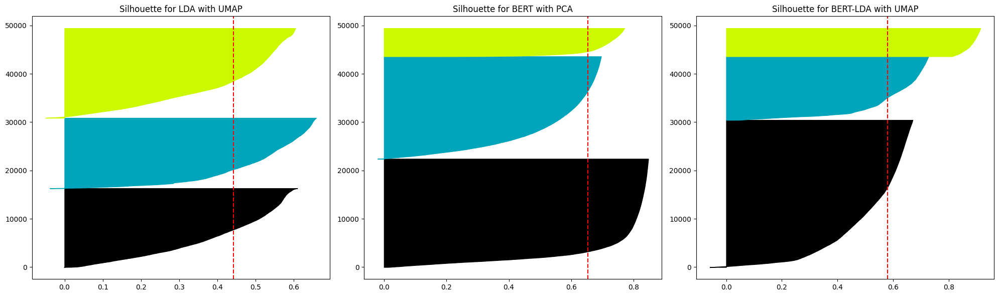

In [39]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm
import numpy as np
import matplotlib.pyplot as plt

# Assuming you've already loaded the data
# data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')

# Extracting UMAP coordinates and labels for each technique
umap_lda = data[['UMAP_x_lda', 'UMAP_y_lda']].values
umap_lda_labels = data['UMAP_cluster_lda']

umap_bert = data[['PCA_x_bert', 'PCA_y_bert']].values
umap_bert_labels = data['PCA_cluster_bert']

umap_bert_lda = data[['UMAP_x_bert_lda', 'UMAP_y_bert_lda']].values
umap_bert_lda_labels = data['UMAP_cluster_bert_lda']

def silhouette_plot(data, labels, title, ax):
    silhouette_avg = silhouette_score(data, labels)
    sample_silhouette_values = silhouette_samples(data, labels)

    y_lower = 3
    for i in range(3):  # Assuming 3 clusters
        cluster_silhouette_vals = sample_silhouette_values[labels == i]
        cluster_silhouette_vals.sort()
        size_cluster = cluster_silhouette_vals.shape[0]
        y_upper = y_lower + size_cluster

        color = cm.nipy_spectral(float(i) / 3)
        ax.fill_betweenx(np.arange(y_lower, y_upper), 0, cluster_silhouette_vals, facecolor=color, edgecolor=color)

        y_lower = y_upper + 3

    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax.set_title(title)

fig, axs = plt.subplots(1, 3, figsize=(20, 6))

# LDA with UMAP Silhouette
silhouette_plot(umap_lda, umap_lda_labels, 'Silhouette for LDA with UMAP', axs[0])

# BERT with PCA Silhouette
silhouette_plot(umap_bert, umap_bert_labels, 'Silhouette for BERT with PCA', axs[1])

# BERT-LDA with UMAP Silhouette
silhouette_plot(umap_bert_lda, umap_bert_lda_labels, 'Silhouette for BERT-LDA with UMAP', axs[2])

plt.tight_layout()
plt.show()


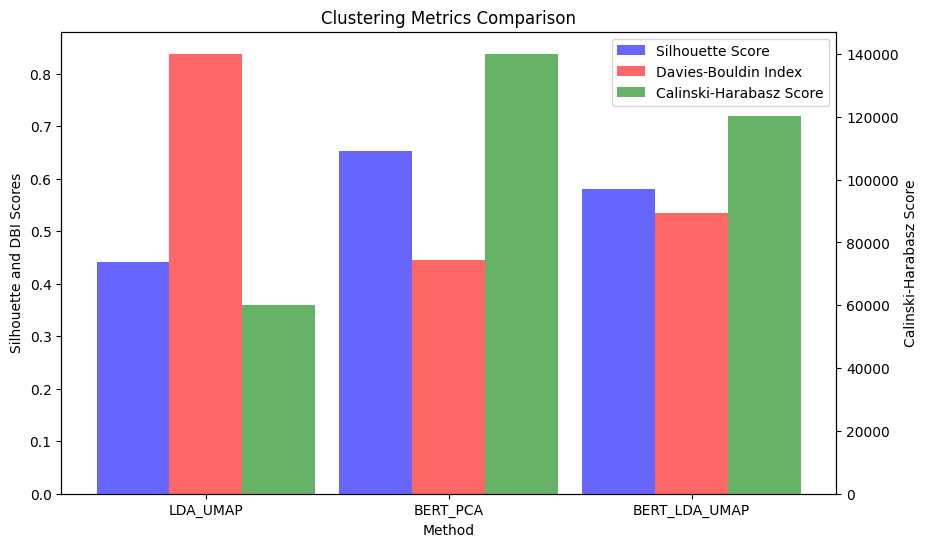

In [44]:
def compute_metrics(data, x_col, y_col, cluster_col):
    silhouette_avg = silhouette_score(data[[x_col, y_col]], data[cluster_col])
    dbi = davies_bouldin_score(data[[x_col, y_col]], data[cluster_col])
    ch_score = calinski_harabasz_score(data[[x_col, y_col]], data[cluster_col])

    return silhouette_avg, dbi, ch_score

metrics = {}
methods = ['LDA_UMAP', 'BERT_PCA', 'BERT_LDA_UMAP']
metrics['LDA_UMAP'] = compute_metrics(data, 'UMAP_x_lda', 'UMAP_y_lda', 'UMAP_cluster_lda')
metrics['BERT_PCA'] = compute_metrics(data, 'PCA_x_bert', 'PCA_y_bert', 'PCA_cluster_bert')
metrics['BERT_LDA_UMAP'] = compute_metrics(data, 'UMAP_x_bert_lda', 'UMAP_y_bert_lda', 'UMAP_cluster_bert_lda')

# Create a bar plot for the metrics
labels = methods
silhouette_scores = [metrics[method][0] for method in methods]
dbi_scores = [metrics[method][1] for method in methods]
ch_scores = [metrics[method][2] for method in methods]

x = np.arange(len(labels))
width = 0.3

fig, ax1 = plt.subplots(figsize=(10, 6))

# Twin the axes for two different y-axes
ax2 = ax1.twinx()
ax1.bar(x - width, silhouette_scores, width, label='Silhouette Score', color='b', alpha=0.6)
ax1.bar(x, dbi_scores, width, label='Davies-Bouldin Index', color='r', alpha=0.6)
ax2.bar(x + width, ch_scores, width, label='Calinski-Harabasz Score', color='g', alpha=0.6)

# Added these three lines to make the legend work
lines, labels_ = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels_ + labels2, loc=0)

ax1.set_xlabel('Method')
ax1.set_ylabel('Silhouette and DBI Scores')
ax2.set_ylabel('Calinski-Harabasz Score')
ax1.set_xticks(x)
ax1.set_xticklabels(labels)
ax1.set_title('Clustering Metrics Comparison')

plt.show()



Comparison Plot:
Finally, we'll plot the three scores for the three methods side-by-side for comparison.

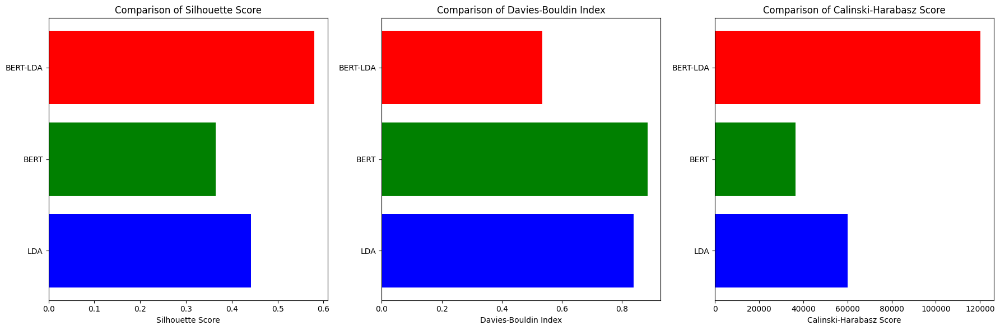

In [4]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt

import pandas as pd


# Load data
data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')

# Extract data and labels from your DataFrame
umap_lda_data = data[['UMAP_x_lda', 'UMAP_y_lda']].values
umap_lda_labels = data['UMAP_cluster_lda'].values

umap_bert_data = data[['UMAP_x_bert', 'UMAP_y_bert']].values
umap_bert_labels = data['UMAP_cluster_bert'].values

reduced_umap_data = data[['UMAP_x_bert_lda', 'UMAP_y_bert_lda']].values
reduced_umap_labels = data['UMAP_cluster_bert_lda'].values

# Compute the metrics for each technique
metrics = {
    'Silhouette Score': silhouette_score,
    'Davies-Bouldin Index': davies_bouldin_score,
    'Calinski-Harabasz Score': calinski_harabasz_score
}

scores = {
    'LDA': {},
    'BERT': {},
    'BERT-LDA': {}
}

for name, metric in metrics.items():
    scores['LDA'][name] = metric(umap_lda_data, umap_lda_labels)
    scores['BERT'][name] = metric(umap_bert_data, umap_bert_labels)
    scores['BERT-LDA'][name] = metric(reduced_umap_data, reduced_umap_labels)

labels = list(scores.keys())

# Set up the figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, (name, _) in enumerate(metrics.items()):
    ax = axes[idx]
    ax.barh(labels, [scores[label][name] for label in labels], color=['blue', 'green', 'red'])
    ax.set_xlabel(name)
    ax.set_title(f'Comparison of {name}')

plt.tight_layout()
plt.show()


Extracting Recipes for Each Cluster
or each clustering method (BERT with PCA, BERT-LDA with UMAP, and LDA with UMAP), we want to filter your dataset to get the recipes corresponding to each cluster

In [6]:
bert_pca_cluster_0 = data[data['PCA_cluster_bert'] == 0]
bert_pca_cluster_1 = data[data['PCA_cluster_bert'] == 1]
bert_pca_cluster_2 = data[data['PCA_cluster_bert'] == 2]

bert_lda_umap_cluster_0 = data[data['UMAP_cluster_bert_lda'] == 0]
bert_lda_umap_cluster_1 = data[data['UMAP_cluster_bert_lda'] == 1]
bert_lda_umap_cluster_2 = data[data['UMAP_cluster_bert_lda'] == 2]

lda_umap_cluster_0 = data[data['UMAP_cluster_lda'] == 0]
lda_umap_cluster_1 = data[data['UMAP_cluster_lda'] == 1]
lda_umap_cluster_2 = data[data['UMAP_cluster_lda'] == 2]

def extract_recipes_for_cluster(data, cluster_column):
    clusters = {}
    unique_labels = data[cluster_column].unique()
    for label in unique_labels:
        clusters[label] = data[data[cluster_column] == label]
    return clusters

def ingredient_counts(cluster_df, ingredient_column='preprocessed_ingredients'):
    # Assuming ingredients in a recipe are comma-separated
    ingredients = cluster_df[ingredient_column].str.split(',', expand=True).stack()
    return ingredients.value_counts()

clustering_methods = {
    'BERT with PCA': 'PCA_cluster_bert',
    'BERT-LDA with UMAP': 'UMAP_cluster_bert_lda',
    'LDA with UMAP': 'UMAP_cluster_lda'
}

for method_name, cluster_column in clustering_methods.items():
    print(f"Results for {method_name}:\n{'-' * 40}")

    # Extract recipes
    clusters = extract_recipes_for_cluster(data, cluster_column)

    for cluster_label, cluster_df in clusters.items():
        print(f"\nCluster {cluster_label}:\n{'=' * 30}")

        # Print total number of recipes in the cluster
        print(f"Total recipes: {len(cluster_df)}")

        # Analyze and print ingredient patterns
        ingredient_distribution = ingredient_counts(cluster_df)

        # Printing top 10 ingredients for brevity
        print("\nTop 10 Ingredients:")
        print(ingredient_distribution.head(10))

    print("\n\n")


Results for BERT with PCA:
----------------------------------------

Cluster 1:
Total recipes: 21185

Top 10 Ingredients:
pound pepper brown tenderloin julienn cook trim inch remov ground larg sweet snowpea cornstarch pineappl potato juic white medium teaspoon canola tablespoon sugar diagon ginger tamari oil peel slice seed rice pork scallion yellow sherri granul onion garlic rib    2
plu teaspoon water brown rice tablespoon sugar minc garlic cornstarch sauc ginger wine sweet                                                                                                                                                                            2
core dice granni kosher inch extra yam salt pepita garnet larg separ thinli lardon white virgin pumpkin thick toast green oil peel part slice seed scallion bacon appl smith oliv onion                                                                                 2
fine extract clove soda brown chocol chop vanilla flour purpos firmli ground egg

In [8]:
bert_pca_cluster_0 = data[data['PCA_cluster_bert'] == 0]
bert_pca_cluster_1 = data[data['PCA_cluster_bert'] == 1]
bert_pca_cluster_2 = data[data['PCA_cluster_bert'] == 2]

bert_lda_umap_cluster_0 = data[data['UMAP_cluster_bert_lda'] == 0]
bert_lda_umap_cluster_1 = data[data['UMAP_cluster_bert_lda'] == 1]
bert_lda_umap_cluster_2 = data[data['UMAP_cluster_bert_lda'] == 2]

lda_umap_cluster_0 = data[data['UMAP_cluster_lda'] == 0]
lda_umap_cluster_1 = data[data['UMAP_cluster_lda'] == 1]
lda_umap_cluster_2 = data[data['UMAP_cluster_lda'] == 2]

def extract_recipes_for_cluster(data, cluster_column):
    clusters = {}
    unique_labels = data[cluster_column].unique()
    for label in unique_labels:
        clusters[label] = data[data[cluster_column] == label]
    return clusters

def ingredient_counts(cluster_df, ingredient_column='preprocessed_ingredients'):
    
    ingredients = cluster_df[ingredient_column].str.split(',', expand=True).stack()
    return ingredients.value_counts()

clustering_methods = {
    'BERT with PCA': 'PCA_cluster_bert',
    'BERT-LDA with UMAP': 'UMAP_cluster_bert_lda',
    'LDA with UMAP': 'UMAP_cluster_lda'
}

for method_name, cluster_column in clustering_methods.items():
    print(f"Results for {method_name}:\n{'-' * 40}")

    # Extract recipes
    clusters = extract_recipes_for_cluster(data, cluster_column)

    for cluster_label, cluster_df in clusters.items():
        print(f"\nCluster {cluster_label}:\n{'=' * 30}")

        # Print total number of recipes in the cluster
        print(f"Total recipes: {len(cluster_df)}")

        # Analyze and print ingredient patterns
        ingredient_distribution = ingredient_counts(cluster_df)

        # Printing top 10 ingredients for brevity
        print("\nTop 10 Ingredients:")
        print(ingredient_distribution.head(10))

    print("\n\n")

Results for BERT with PCA:
----------------------------------------

Cluster 1:
Total recipes: 21185

Top 10 Ingredients:
variabl reach turn minut select desir contain lid order slowli speed secur list place increas blend vitamix ingredi machin high consist                                                                                          4
ingredi combin                                                                                                                                                                                                                   3
blend pour ingredi smooth blender                                                                                                                                                                                                3
larg ingredi bowl toss combin                                                                                                                                                                        

In [9]:
def direction_counts(cluster_df, direction_column='preprocessed_directions'):
    
    directions = cluster_df[direction_column].str.split(expand=True).stack()
    return directions.value_counts()

for method_name, cluster_column in clustering_methods.items():
    print(f"Results for {method_name}:\n{'-' * 40}")

    # Extract recipes
    clusters = extract_recipes_for_cluster(data, cluster_column)

    for cluster_label, cluster_df in clusters.items():
        print(f"\nCluster {cluster_label}:\n{'=' * 30}")

        # Print total number of recipes in the cluster
        print(f"Total recipes: {len(cluster_df)}")

        # Analyze and print direction patterns
        direction_distribution = direction_counts(cluster_df)

        # Printing top 10 directions for brevity
        print("\nTop 10 Directions:")
        print(direction_distribution.head(10))

    print("\n\n")


Results for BERT with PCA:
----------------------------------------

Cluster 1:
Total recipes: 21185

Top 10 Directions:
minut     16966
salt      14596
serv      13571
heat      13413
add       12932
bowl      12869
cook      12493
pepper    11223
medium    11221
larg      10495
dtype: int64

Cluster 0:
Total recipes: 22414

Top 10 Directions:
minut     17984
salt      15409
serv      14506
heat      14234
add       13794
bowl      13614
cook      13306
medium    11917
pepper    11909
larg      11301
dtype: int64

Cluster 2:
Total recipes: 5840

Top 10 Directions:
minut     4637
salt      4022
serv      3802
heat      3681
add       3576
bowl      3500
cook      3473
pepper    3189
medium    3086
larg      2942
dtype: int64



Results for BERT-LDA with UMAP:
----------------------------------------

Cluster 0:
Total recipes: 30436

Top 10 Directions:
minut     25429
salt      24496
pepper    22455
heat      21668
cook      21208
serv      21171
add       19891
bowl      18128
medium  

In [10]:
def combined_recipe_counts(cluster_df, ingredient_column='preprocessed_ingredients', direction_column='preprocessed_directions'):
    # Combine the ingredients and directions columns, and then split by spaces
    combined = cluster_df[ingredient_column] + " " + cluster_df[direction_column]
    terms = combined.str.split(expand=True).stack()
    return terms.value_counts()

for method_name, cluster_column in clustering_methods.items():
    print(f"Results for {method_name}:\n{'-' * 40}")

    # Extract recipes
    clusters = extract_recipes_for_cluster(data, cluster_column)

    for cluster_label, cluster_df in clusters.items():
        print(f"\nCluster {cluster_label}:\n{'=' * 30}")

        # Print total number of recipes in the cluster
        print(f"Total recipes: {len(cluster_df)}")

        # Analyze and print ingredient patterns
        ingredient_distribution = ingredient_counts(cluster_df)
        print("\nTop 10 Ingredients:")
        print(ingredient_distribution.head(10))

        # Analyze and print direction patterns
        direction_distribution = direction_counts(cluster_df)
        print("\nTop 10 Directions:")
        print(direction_distribution.head(10))

        # Analyze and print patterns from the full recipe
        recipe_distribution = combined_recipe_counts(cluster_df)
        print("\nTop 10 Recipe Terms:")
        print(recipe_distribution.head(10))

    print("\n\n")


Results for BERT with PCA:
----------------------------------------

Cluster 1:
Total recipes: 21185

Top 10 Ingredients:
variabl reach turn minut select desir contain lid order slowli speed secur list place increas blend vitamix ingredi machin high consist                                                                                          4
ingredi combin                                                                                                                                                                                                                   3
blend pour ingredi smooth blender                                                                                                                                                                                                3
larg ingredi bowl toss combin                                                                                                                                                                        

In [11]:
pip install wordcloud matplotlib


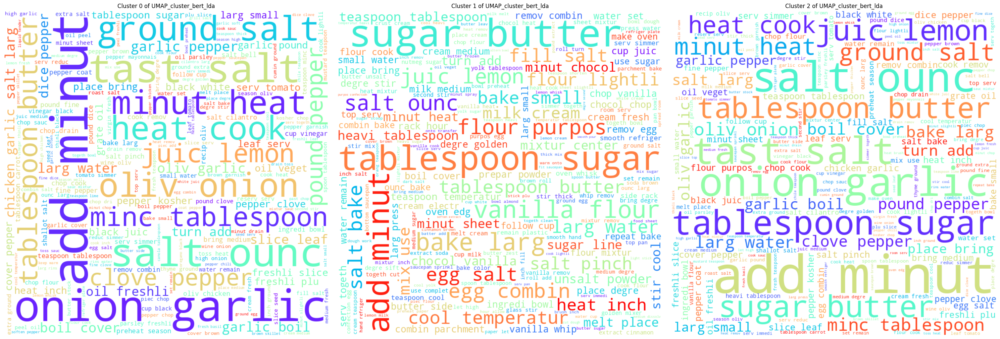

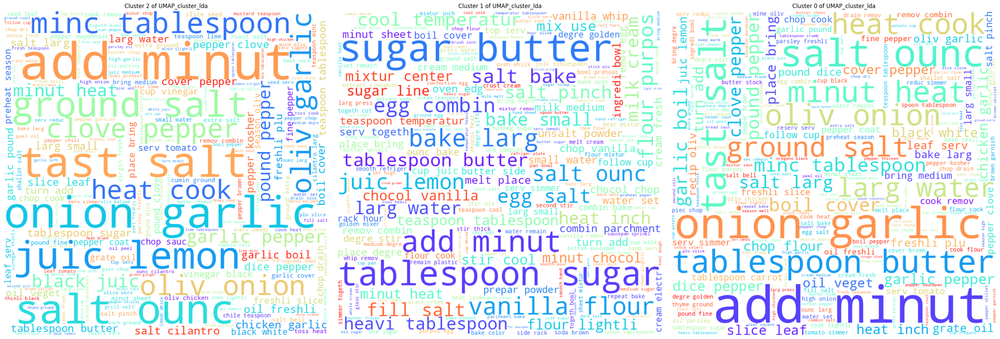

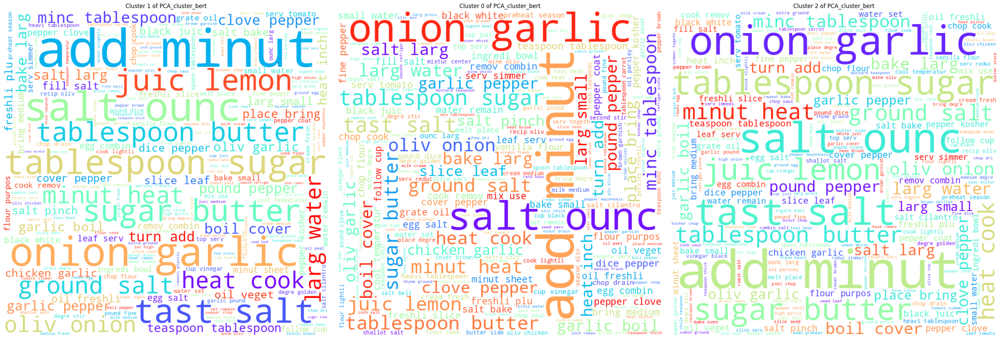

In [18]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming you have a DataFrame `data` with the preprocessed full recipes

# Modify the wordcloud function for rainbow colors
def generate_wordcloud(text):
    wordcloud = WordCloud(
        background_color='white',
        colormap='rainbow',  # Use the rainbow colormap
        max_words=200,
        width=800,
        height=800,
        contour_color='pink',
        contour_width=2
    ).generate(text)
    return wordcloud

# Function to generate combined wordclouds for each method
def generate_combined_wordclouds_for_method(method_column):
    fig, axs = plt.subplots(1, 3, figsize=(30, 10))

    for i, cluster in enumerate(data[method_column].unique()):
        # Concatenate all preprocessed full recipes in the cluster
        text = " ".join(data[data[method_column] == cluster]['preprocessed_full_recipe'])

        # Generate wordcloud
        wc = generate_wordcloud(text)

        # Plot the wordcloud
        axs[i].imshow(wc, interpolation='bilinear')
        axs[i].axis('off')
        axs[i].set_title(f"Cluster {cluster} of {method_column}")

    plt.tight_layout()
    plt.savefig(f"{method_column}_wordclouds.png")
    plt.show()

# Generate combined wordclouds for each of the methods
methods = ['UMAP_cluster_bert_lda', 'UMAP_cluster_lda', 'PCA_cluster_bert']
for method in methods:
    generate_combined_wordclouds_for_method(method)


In [7]:
import pandas as pd

# 1. Load data
data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')

# Define a function to display a sample of recipes from a specific cluster
def display_sample(dataframe, column_name, cluster_label, num_samples=10):
    sample = dataframe[dataframe[column_name] == cluster_label].sample(num_samples)
    return sample[['title', 'preprocessed_ingredients', 'preprocessed_directions']]

# Display samples
print("Sample recipes from Cluster 2 for BERT with PCA:")
print(display_sample(data, 'PCA_cluster_bert', 2))

print("\nSample recipes from Cluster 2 for BERT-LDA with UMAP:")
print(display_sample(data, 'UMAP_cluster_bert_lda', 2))

print("\nSample recipes from Cluster 0 for LDA with UMAP:")
print(display_sample(data, 'UMAP_cluster_lda', 0))

print("\nSample recipes from Cluster 2 for LDA with UMAP:")
print(display_sample(data, 'UMAP_cluster_lda', 2))



Sample recipes from Cluster 2 for BERT with PCA:
                                                   title  \
41849                        Bread Soup for Lent: Panada   
40290                         Black Swan Seafood Risotto   
40354  Pan Seared Walleye with Celery Root Puree and ...   
40928  Crisp Fried Oysters with Asian Vegetable Slaw ...   
38182                                          The Works   
39004                                   Espresso Granita   
37625                          White Pizzas with Arugula   
39331                                    Summer Gazpacho   
39637    Asian Soupe de Poissin with Saffron-Garlic Foam   
42598                  Honeyed Whole-Grain Drop Biscuits   

                                preprocessed_ingredients  \
41849  pound pepper back past chop extra egg salt coa...   
40290  pound herb main garnish stalk live truffl cham...   
40354  pound dice granni piec ounc root bunch skin le...   
40928  chili sauc ground smooth wedg cup turmer ju

In [11]:
import pandas as pd

# Load the dataset
data = pd.read_csv('/content/drive/My Drive/updated_clustered_recipe.csv')

def extract_recipes_for_cluster(data, cluster_column):
    clusters = {}
    unique_labels = data[cluster_column].unique()
    for label in unique_labels:
        clusters[label] = data[data[cluster_column] == label]
    return clusters

def extract_sample_recipes(cluster_df, recipe_column='preprocessed_full_recipe', n=5):
    # Extract 'n' sample recipes from the cluster
    sample_recipes = cluster_df[recipe_column].sample(n)
    return sample_recipes

clustering_methods = {
    'BERT with PCA': 'PCA_cluster_bert',
    'BERT-LDA with UMAP': 'UMAP_cluster_bert_lda',
    'LDA with UMAP': 'UMAP_cluster_lda'
}

for method_name, cluster_column in clustering_methods.items():
    print(f"Results for {method_name}:\n{'-' * 40}")

    # Extract recipes
    clusters = extract_recipes_for_cluster(data, cluster_column)

    for cluster_label, cluster_df in clusters.items():
        print(f"\nCluster {cluster_label}:\n{'=' * 30}")

        # Print total number of recipes in the cluster
        print(f"Total recipes: {len(cluster_df)}")

        # Extract and print sample recipes
        sample_recipes = extract_sample_recipes(cluster_df)
        print("\nSample Recipes:")
        for i, recipe in enumerate(sample_recipes, 1):
            print(f"{i}. {recipe}")

    print("\n\n")


Results for BERT with PCA:
----------------------------------------

Cluster 1:
Total recipes: 21185

Sample Recipes:
1. cooki extract amaretti saronno vanilla lightli extra marsala larg crush cream italian teaspoon yolk heavi sugar cold doubl pure superfin almond florio wine cover walk mixtur depend marsala overnight hand froth glass sugar crumb decor size expand rubber attach wine thicken amaretti larg water set remain plastic away cream electr mixer almost spoon tablespoon leav hour wrap doubl rest top bowl almond boiler twice constantli spatula extract proof minut heat disappear becom place form cold fit sprinkl chill dont vanilla volum egg trail crush youll peak whisk firm care cool temperatur yolk beat asid scrambl room serv simmer togeth fold
2. dice pepper cover kosher chop drain sauc head remov thyme ground tast salt ounc larg rins follow cup potato vinegar black chickpea white yukon pumpkin floret pimento chayot tablespoon carrot cauliflow stem stock ginger powder curri scotc